# Sample Comparison: All Methods

Single-sample comparison on training block `338`:

- methods as columns
- IPF `X / Y / Z` as separate rows
- one combined display instead of scattered plots
- relevant metrics as rows
- separate misorientation histograms for each method in one row


In [1]:
# ── GPU Selection: pick the GPU with the most free memory ──────────────────
import os
import subprocess

os.environ.setdefault("CUDA_DEVICE_ORDER", "PCI_BUS_ID")
SELECTED_CUDA_DEVICE_INDEX = None


def _pick_most_free_gpu():
    try:
        result = subprocess.run(
            [
                "nvidia-smi",
                "--query-gpu=index,memory.free",
                "--format=csv,noheader,nounits",
            ],
            check=True,
            capture_output=True,
            text=True,
        )
    except Exception as exc:
        print(f"GPU auto-select skipped: {exc}")
        return None

    rows = []
    for line in result.stdout.strip().splitlines():
        parts = [part.strip() for part in line.split(",")]
        if len(parts) < 2:
            continue
        idx_text, free_text = parts[:2]
        if idx_text.isdigit() and free_text.isdigit():
            rows.append((int(free_text), int(idx_text)))

    if not rows:
        print("GPU auto-select skipped: no GPUs reported by nvidia-smi")
        return None

    free_mb, gpu_idx = max(rows)
    print(f"Using GPU {gpu_idx} with {free_mb} MiB free")
    return gpu_idx


SELECTED_CUDA_DEVICE_INDEX = _pick_most_free_gpu()

if "torch" in globals() and SELECTED_CUDA_DEVICE_INDEX is not None and torch.cuda.is_available():
    try:
        torch.cuda.set_device(SELECTED_CUDA_DEVICE_INDEX)
        print(f"torch already imported; switched current device to cuda:{SELECTED_CUDA_DEVICE_INDEX}")
        print("Re-run Section 1 and later cells so they use the selected GPU explicitly.")
    except Exception as exc:
        print(f"Could not switch torch CUDA device: {exc}")


Using GPU 7 with 40322 MiB free


In [2]:
# ── Section 1: Setup ─────────────────────────────────────────────────────────
import os
import sys
import importlib
from pathlib import Path
from collections import OrderedDict

os.environ.setdefault("MPLCONFIGDIR", "/tmp/matplotlib")
os.environ.setdefault("NUMBA_CACHE_DIR", "/tmp/numba")
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")

import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter

repo_root = Path.cwd()
if not (repo_root / "training").exists():
    for p in [Path.cwd(), *Path.cwd().parents]:
        if (p / "training").exists():
            repo_root = p
            break
repo_root = repo_root.resolve()
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

analysis_dir = str(repo_root / "analysis")
if analysis_dir not in sys.path:
    sys.path.insert(0, analysis_dir)

# Jupyter keeps imported project modules cached across reruns. Clear any
# repo-local modules here so rerunning Section 1 picks up on-disk fixes.
_project_prefixes = ("training", "inference", "models", "utils", "visualization")
_reloaded_modules = []
for _name, _mod in list(sys.modules.items()):
    if not any(_name == _prefix or _name.startswith(_prefix + ".") for _prefix in _project_prefixes):
        continue
    _mod_file = getattr(_mod, "__file__", None)
    if not _mod_file:
        continue
    try:
        _mod_path = Path(_mod_file).resolve()
    except Exception:
        continue
    if repo_root in _mod_path.parents or _mod_path == repo_root:
        sys.modules.pop(_name, None)
        _reloaded_modules.append(_name)
importlib.invalidate_caches()

from training.config_utils import load_and_prepare_config
from inference import infer_iso_embedding_sr_attn as inf
from models.bicubic_f_interpolate_sr import QuaternionBicubicFInterpolateSR
from utils.symmetry_utils import resolve_symmetry
from utils import format_quaternions, reduce_to_fz_min_angle
from visualization.ipf_render import render_ipf_rgb

try:
    from skimage.metrics import structural_similarity as sk_ssim
    SKIMAGE_AVAILABLE = True
except ImportError:
    sk_ssim = None
    SKIMAGE_AVAILABLE = False

selected_gpu = globals().get("SELECTED_CUDA_DEVICE_INDEX", None)
if torch.cuda.is_available():
    if selected_gpu is None:
        selected_gpu = torch.cuda.current_device()
    device = torch.device(f"cuda:{int(selected_gpu)}")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
sym = resolve_symmetry("Oh")

print("repo_root:", repo_root)
if _reloaded_modules:
    print("cleared_cached_repo_modules:", len(_reloaded_modules))
print("device:", device)
if device.type == "cuda":
    print("cuda_device_name:", torch.cuda.get_device_name(device))
print("symmetry:", getattr(sym, "name", "Oh"))


repo_root: /data/home/umang/Materials/Reynolds-QSR_4x1_prev_git
device: cuda:7
cuda_device_name: NVIDIA A100-PCIE-40GB
symmetry: m-3m


In [3]:
# ── Section 2: Quaternion + metric helpers (matching metrics notebook) ─────
def normalize_quat(q, eps=1e-12):
    q = np.asarray(q, dtype=np.float64)
    if q.size == 0:
        return q
    if q.shape[-1] != 4:
        raise ValueError("Quaternion arrays must have last axis size 4")
    n = np.linalg.norm(q.reshape(-1, 4), axis=1).reshape(q.shape[:-1] + (1,))
    return q / (n + eps)


def quat_conjugate(q):
    q = np.asarray(q)
    return q * np.array([1.0, -1.0, -1.0, -1.0])


def quat_mul(a, b):
    a = np.asarray(a)
    b = np.asarray(b)
    if a.shape[-1] != 4 or b.shape[-1] != 4:
        raise ValueError("Input quaternions must have shape (..., 4)")
    w1, x1, y1, z1 = a[..., 0], a[..., 1], a[..., 2], a[..., 3]
    w2, x2, y2, z2 = b[..., 0], b[..., 1], b[..., 2], b[..., 3]
    w = w1 * w2 - x1 * x2 - y1 * y2 - z1 * z2
    x = w1 * x2 + x1 * w2 + y1 * z2 - z1 * y2
    y = w1 * y2 - x1 * z2 + y1 * w2 + z1 * x2
    z = w1 * z2 + x1 * y2 - y1 * x2 + z1 * w2
    return np.stack((w, x, y, z), axis=-1)


def crystallographic_misorientation(q_pred, q_gt, sym_quats=None, degrees=True):
    q_pred = np.asarray(q_pred, dtype=np.float64)
    q_gt = np.asarray(q_gt, dtype=np.float64)

    if q_pred.shape[-1] != 4 or q_gt.shape[-1] != 4:
        raise ValueError("Input quaternions must have last axis length 4")

    q_pred = normalize_quat(q_pred)
    q_gt = normalize_quat(q_gt)

    if sym_quats is None:
        sym_qs = None
    elif isinstance(sym_quats, str):
        sym_qs = np.asarray(resolve_symmetry(sym_quats).data, dtype=np.float64)
    elif hasattr(sym_quats, "data"):
        sym_qs = np.asarray(sym_quats.data, dtype=np.float64)
    elif hasattr(sym_quats, "to_quaternion"):
        sym_qs = np.asarray(sym_quats.to_quaternion(), dtype=np.float64)
    elif isinstance(sym_quats, np.ndarray):
        sym_qs = np.asarray(sym_quats, dtype=np.float64)
        if sym_qs.ndim != 2 or sym_qs.shape[1] != 4:
            raise ValueError("sym_quats numpy array must have shape (G, 4)")
    else:
        raise ValueError("Unknown sym_quats type")

    shape = q_pred.shape[:-1]
    qp = q_pred.reshape(-1, 4)
    qg = q_gt.reshape(-1, 4)

    if sym_qs is None:
        dots = np.abs(np.sum(qp * qg, axis=-1))
        dots = np.clip(dots, -1.0, 1.0)
        ang = 2.0 * np.arccos(dots)
        if degrees:
            ang = np.degrees(ang)
        return ang.reshape(shape)

    ops = sym_qs.copy()
    ops[:, 1:] *= -1.0
    gq = quat_mul(ops[:, None, :], qg[None, :, :])
    dots = np.abs(np.sum(gq * qp[None, :, :], axis=-1))
    dots = np.clip(dots, -1.0, 1.0)
    ang = 2.0 * np.arccos(dots)
    min_ang = np.min(ang, axis=0)
    if degrees:
        min_ang = np.degrees(min_ang)
    return min_ang.reshape(shape)


def misorientation_map(pred_q, gt_q, sym_quats=None, degrees=True):
    return crystallographic_misorientation(pred_q, gt_q, sym_quats=sym_quats, degrees=degrees)


def quaternion_mean(qs):
    qs = np.asarray(qs, dtype=np.float64).reshape(-1, 4)
    qs = normalize_quat(qs)
    M = np.dot(qs.T, qs)
    w, v = np.linalg.eigh(M)
    avg = v[:, np.argmax(w)]
    if avg[0] < 0:
        avg = -avg
    return normalize_quat(avg)


def compute_grod(ori_map, grain_labels=None, sym_ops=None, window_size=21):
    ori_map = np.asarray(ori_map, dtype=np.float64)
    H, W = ori_map.shape[:2]
    if grain_labels is not None:
        labels = np.asarray(grain_labels)
        grod = np.zeros((H, W), dtype=np.float64)
        grain_stats = {}
        for lab in np.unique(labels):
            mask = labels == lab
            if np.count_nonzero(mask) == 0:
                continue
            qs = ori_map[mask]
            mean_q = quaternion_mean(qs)
            grod_vals = crystallographic_misorientation(
                qs, np.tile(mean_q, (qs.shape[0], 1)), sym_quats=sym_ops, degrees=True
            )
            grod[mask] = grod_vals
            grain_stats[int(lab)] = {
                "mean": float(np.nanmean(grod_vals)),
                "max": float(np.nanmax(grod_vals)),
                "std": float(np.nanstd(grod_vals)),
                "count": int(qs.shape[0]),
            }
        return grod, grain_stats

    q = normalize_quat(ori_map)
    M_local = np.zeros((H, W, 4, 4), dtype=np.float64)
    for i in range(4):
        for j in range(i, 4):
            arr = q[..., i] * q[..., j]
            local = uniform_filter(arr, size=window_size, mode="reflect")
            M_local[..., i, j] = local
            M_local[..., j, i] = local
    M_flat = M_local.reshape(-1, 4, 4)
    w, v = np.linalg.eigh(M_flat)
    avg = v[:, :, -1]
    signs = np.where(avg[:, 0] < 0, -1.0, 1.0).reshape(-1, 1)
    avg = (avg * signs).reshape(H, W, 4)
    avg = normalize_quat(avg)
    grod = crystallographic_misorientation(ori_map, avg, sym_quats=sym_ops, degrees=True)
    stats = {
        "mean": float(np.nanmean(grod)),
        "max": float(np.nanmax(grod)),
        "std": float(np.nanstd(grod)),
    }
    return grod, stats


def compute_kam(ori_map, grain_labels=None, radius=1, sym_ops=None, ignore_threshold_deg=15.0, ref_patch=None):
    if ref_patch is not None:
        ori_map = ref_patch

    ori_map = np.asarray(ori_map, dtype=np.float64)
    H, W = ori_map.shape[:2]
    neighbors = []
    for dy in range(-radius, radius + 1):
        for dx in range(-radius, radius + 1):
            if dy == 0 and dx == 0:
                continue
            neighbors.append((dy, dx))

    vals = np.zeros((len(neighbors), H, W), dtype=np.float64)
    for k, (dy, dx) in enumerate(neighbors):
        src_y0 = max(0, -dy)
        src_y1 = H - max(0, dy)
        src_x0 = max(0, -dx)
        src_x1 = W - max(0, dx)
        dst_y0 = max(0, dy)
        dst_y1 = H - max(0, -dy)
        dst_x0 = max(0, dx)
        dst_x1 = W - max(0, -dx)

        shifted = np.zeros_like(ori_map)
        shifted[dst_y0:dst_y1, dst_x0:dst_x1] = ori_map[src_y0:src_y1, src_x0:src_x1]

        vm = np.zeros((H, W), dtype=bool)
        vm[dst_y0:dst_y1, dst_x0:dst_x1] = True
        if grain_labels is not None:
            same_grain = np.zeros((H, W), dtype=bool)
            same_grain[dst_y0:dst_y1, dst_x0:dst_x1] = (
                grain_labels[dst_y0:dst_y1, dst_x0:dst_x1]
                == grain_labels[src_y0:src_y1, src_x0:src_x1]
            )
            vm = vm & same_grain

        mis = np.full((H, W), np.nan, dtype=np.float64)
        if np.any(vm):
            mis_vals = crystallographic_misorientation(
                ori_map[vm], shifted[vm], sym_quats=sym_ops, degrees=True
            )
            mis[vm] = mis_vals
        if ignore_threshold_deg is not None:
            mis[mis > ignore_threshold_deg] = np.nan
        vals[k] = mis

    kam = np.nanmean(vals, axis=0)
    stats = {
        "mean": float(np.nanmean(kam)),
        "max": float(np.nanmax(kam)),
        "std": float(np.nanstd(kam)),
    }
    return kam, stats




def compute_boundary_mask(ori_map, *, sym_ops=None, threshold_deg=5.0, connectivity=4):
    ori_map = np.asarray(ori_map, dtype=np.float64)
    H, W = ori_map.shape[:2]
    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    if connectivity == 8:
        neighbors += [(-1, -1), (-1, 1), (1, -1), (1, 1)]

    boundary = np.zeros((H, W), dtype=bool)
    for dy, dx in neighbors:
        src_y0 = max(0, -dy)
        src_y1 = H - max(0, dy)
        src_x0 = max(0, -dx)
        src_x1 = W - max(0, dx)
        dst_y0 = max(0, dy)
        dst_y1 = H - max(0, -dy)
        dst_x0 = max(0, dx)
        dst_x1 = W - max(0, -dx)

        shifted = np.zeros_like(ori_map)
        shifted[dst_y0:dst_y1, dst_x0:dst_x1] = ori_map[src_y0:src_y1, src_x0:src_x1]

        valid_mask = np.zeros((H, W), dtype=bool)
        valid_mask[dst_y0:dst_y1, dst_x0:dst_x1] = True

        mis = np.zeros((H, W), dtype=np.float64)
        if np.any(valid_mask):
            mis_vals = crystallographic_misorientation(
                ori_map[valid_mask],
                shifted[valid_mask],
                sym_quats=sym_ops,
                degrees=True,
            )
            mis[valid_mask] = mis_vals
        boundary |= mis > float(threshold_deg)

    return boundary


def boundary_f1_score(sr_boundary, hr_boundary):
    sr_boundary = np.asarray(sr_boundary, dtype=bool)
    hr_boundary = np.asarray(hr_boundary, dtype=bool)
    tp = int(np.sum(sr_boundary & hr_boundary))
    fp = int(np.sum(sr_boundary & ~hr_boundary))
    fn = int(np.sum(~sr_boundary & hr_boundary))
    denom = 2 * tp + fp + fn
    return float((2 * tp) / denom) if denom > 0 else float('nan')

def _resolve_symmetry_quats(sym_quats):
    if sym_quats is None:
        return None
    if isinstance(sym_quats, str):
        return np.asarray(resolve_symmetry(sym_quats).data, dtype=np.float64)
    if hasattr(sym_quats, "data"):
        return np.asarray(sym_quats.data, dtype=np.float64)
    if hasattr(sym_quats, "to_quaternion"):
        return np.asarray(sym_quats.to_quaternion(), dtype=np.float64)
    arr = np.asarray(sym_quats, dtype=np.float64)
    if arr.ndim != 2 or arr.shape[1] != 4:
        raise ValueError("sym_quats numpy array must have shape (G, 4)")
    return arr


def max_misorientation_from_sym(sym_quats):
    sym_qs = _resolve_symmetry_quats(sym_quats)
    if sym_qs is None:
        return 180.0
    sym_qs = normalize_quat(sym_qs)
    max_angle = 0.0
    for i in range(len(sym_qs)):
        dots = np.abs(np.sum(sym_qs[i] * sym_qs, axis=-1))
        dots = np.clip(dots, -1.0, 1.0)
        max_angle = max(max_angle, float(np.max(2.0 * np.arccos(dots))))
    return float(np.degrees(max_angle))


def psnr_from_map(ref_map, test_map, max_val, eps=1e-10):
    ref_map = np.asarray(ref_map, dtype=np.float64)
    test_map = np.asarray(test_map, dtype=np.float64)
    mse = np.nanmean((ref_map - test_map) ** 2)
    if not np.isfinite(mse) or mse <= 0:
        return float("inf")
    return float(20.0 * np.log10(float(max_val) / np.sqrt(mse + eps)))


def ssim_from_map(ref_map, test_map, win_size=7, data_range=None):
    if not SKIMAGE_AVAILABLE or sk_ssim is None:
        return np.nan
    ref_map = np.asarray(ref_map, dtype=np.float64)
    test_map = np.asarray(test_map, dtype=np.float64)
    if data_range is None:
        data_range = float(
            np.nanmax([np.nanmax(ref_map), np.nanmax(test_map)])
            - np.nanmin([np.nanmin(ref_map), np.nanmin(test_map)])
        )
    if not np.isfinite(data_range) or data_range <= 0:
        return 1.0
    win_size = min(int(win_size), ref_map.shape[0], ref_map.shape[1])
    if win_size % 2 == 0:
        win_size -= 1
    win_size = max(win_size, 3)
    return float(
        sk_ssim(ref_map, test_map, data_range=float(data_range), win_size=win_size, channel_axis=None)
    )




def ssim_from_rgb_map(ref_rgb, test_rgb, win_size=7, data_range=1.0):
    if not SKIMAGE_AVAILABLE or sk_ssim is None:
        return np.nan
    ref_rgb = np.asarray(ref_rgb, dtype=np.float64)
    test_rgb = np.asarray(test_rgb, dtype=np.float64)
    if ref_rgb.ndim != 3 or ref_rgb.shape[-1] != 3:
        raise ValueError(f"Expected RGB map (H, W, 3), got {ref_rgb.shape}")
    if test_rgb.shape != ref_rgb.shape:
        raise ValueError(f"SSIM RGB shape mismatch: {test_rgb.shape} vs {ref_rgb.shape}")
    win_size = min(int(win_size), ref_rgb.shape[0], ref_rgb.shape[1])
    if win_size % 2 == 0:
        win_size -= 1
    win_size = max(win_size, 3)
    return float(
        sk_ssim(ref_rgb, test_rgb, data_range=float(data_range), win_size=win_size, channel_axis=-1)
    )



def ssim_on_ipf(pred_q, gt_q, sym_ops=None, win_size=7, ref_dir="Z"):
    sym_class = sym_ops if sym_ops is not None else sym
    ipf_pred = render_ipf_rgb(pred_q, sym_class, ref_dir=ref_dir)
    ipf_gt = render_ipf_rgb(gt_q, sym_class, ref_dir=ref_dir)
    return ssim_from_rgb_map(ipf_gt, ipf_pred, win_size=win_size, data_range=1.0)

def psnr_on_misorientation(pred_q, gt_q, sym_quats=None):
    mis = misorientation_map(pred_q, gt_q, sym_quats=sym_quats, degrees=True)
    return psnr_from_map(np.zeros_like(mis), mis, max_val=max_misorientation_from_sym(sym_quats))


def ssim_on_misorientation(pred_q, gt_q, sym_quats=None, win_size=7):
    mis = misorientation_map(pred_q, gt_q, sym_quats=sym_quats, degrees=True)
    return ssim_from_map(
        np.zeros_like(mis),
        mis,
        win_size=win_size,
        data_range=max_misorientation_from_sym(sym_quats),
    )


In [4]:
# ── Section 3: Load models + representative training sample ─────────────────
# Keep this aligned with metrics_sr_vs_hr_all.ipynb.
sample_id = 338
DATASET_DIR = Path("/data/home/umang/Materials/Materials_data_mount/datasets/IN718_QSR_4x1")
LR_FILE = DATASET_DIR / "Train" / "LR_Data" / "IN718_QSR_4x1_train_lr_x_block_338.npy"
HR_FILE = DATASET_DIR / "Train" / "HR_Data" / "IN718_QSR_4x1_train_hr_x_block_338.npy"

# "IN718_QSR_4x1_test_hr_z_block_11"
#LR_FILE = DATASET_DIR / "Test" / "LR_Data" / "IN718_QSR_4x1_test_lr_z_block_11.npy"
#HR_FILE = DATASET_DIR / "Test" / "HR_Data" / "IN718_QSR_4x1_test_hr_z_block_11.npy"

# FZ-reduce the raw dataset arrays here, before any model, interpolation,
# patch extraction, metric, or visualization code consumes LR/HR inputs.
# This matches visualization/visualize_sr_results.py: format_quaternions(...,
# normalize=True, hemisphere=True, reduce_fz=True, sym=sym, to_quat_first=False).
lr = format_quaternions(
    np.load(LR_FILE).astype(np.float32),
    normalize=True,
    hemisphere=True,
    reduce_fz=True,
    sym=sym,
    to_quat_first=False,
).astype(np.float32, copy=False)
hr = format_quaternions(
    np.load(HR_FILE).astype(np.float32),
    normalize=True,
    hemisphere=True,
    reduce_fz=True,
    sym=sym,
    to_quat_first=False,
).astype(np.float32, copy=False)

PATCH_ROWS = slice(50, 120)
PATCH_COLS = slice(50, 150)
hr_patch = hr[PATCH_ROWS, PATCH_COLS]
sample_scale = (int(hr.shape[0] // lr.shape[0]), int(hr.shape[1] // lr.shape[1]))


def _as_scale_tuple(scale_value):
    if isinstance(scale_value, (list, tuple)):
        return (int(scale_value[0]), int(scale_value[1]))
    scale_value = int(scale_value)
    return (scale_value, scale_value)


def _resolve_run_cfg_path(exp_dir):
    candidates = [
        exp_dir / "logs" / "inference_run_config.json",
        exp_dir / "logs" / "run_config.json",
    ]
    for path in candidates:
        if path.exists():
            return path
    raise FileNotFoundError(f"No run config found under {exp_dir / 'logs'}")


def _resolve_checkpoint_path(cfg_local, exp_dir, checkpoint_name="best_model.pt"):
    checkpoints_dir = Path(getattr(cfg_local, "checkpoints_dir", exp_dir / "checkpoints"))
    if checkpoint_name is not None:
        return inf._resolve_checkpoint(cfg_local, exp_dir, checkpoint_name)

    candidates = sorted(checkpoints_dir.glob("*.pt"))
    if not candidates:
        raise FileNotFoundError(f"No checkpoints found under {checkpoints_dir}")

    def _checkpoint_rank(path):
        name = path.name
        if name == "last_checkpoint.pt":
            return (3, 0)
        if name.startswith("epoch_") and name.endswith(".pt"):
            epoch_text = name[len("epoch_"):-len(".pt")]
            if epoch_text.isdigit():
                return (2, int(epoch_text))
        if name == "best_model.pt":
            return (1, 0)
        return (0, path.stat().st_mtime_ns)

    return max(candidates, key=_checkpoint_rank)


def _load_experiment_model(exp_dir, *, override_scale=None, checkpoint_name="best_model.pt"):
    cfg_path = exp_dir / "config_new.json"
    run_cfg_path = _resolve_run_cfg_path(exp_dir)
    assert cfg_path.exists(), f"Config missing: {cfg_path}"
    cfg_local = load_and_prepare_config(cfg_path, run_cfg_path)
    if override_scale is not None:
        override_scale = _as_scale_tuple(override_scale)
        original_scale = _as_scale_tuple(getattr(cfg_local, "upsample_factor", getattr(cfg_local, "scale", override_scale)))
        if original_scale != override_scale:
            print(f"Overriding {exp_dir.name} scale from {original_scale} to {override_scale} for this sample.")
        cfg_local.scale = list(override_scale)
        cfg_local.upsample_factor = list(override_scale)
    checkpoint = _resolve_checkpoint_path(cfg_local, exp_dir, checkpoint_name)
    assert checkpoint.exists(), f"Checkpoint missing: {checkpoint}"
    model_local = inf._load_model_from_checkpoint(cfg_local, checkpoint, device)
    return cfg_local, model_local, checkpoint


# Keep the base model loaded because feature-space baselines such as
# ISO Bicubic and ISO NN still use its encoder/decoder, even while the
# direct "Model SR" method is temporarily disabled below.
base_exp_dir = Path("/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_sr_attn_01")
cfg, model, checkpoint = _load_experiment_model(base_exp_dir, override_scale=sample_scale)
print("Base model loaded:", type(model).__name__, "from", checkpoint)
standard_ocrp_exp_dir = Path(
    "/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_4x1_ocrp_01"
)
# Standard OCRP temporarily disabled in this notebook.
standard_ocrp_checkpoint_name = "last_checkpoint.pt"
cfg_standard_ocrp = model_standard_ocrp = checkpoint_standard_ocrp = None
# try:
#     cfg_standard_ocrp, model_standard_ocrp, checkpoint_standard_ocrp = _load_experiment_model(
#         standard_ocrp_exp_dir,
#         override_scale=sample_scale,
#         checkpoint_name=standard_ocrp_checkpoint_name,
#     )
#     print(
#         "Standard OCRP model loaded:",
#         type(model_standard_ocrp).__name__,
#         "from",
#         checkpoint_standard_ocrp,
#     )
# except Exception as exc:
#     print(f"Skipping Standard OCRP: {type(exc).__name__}: {exc}")

anchorless_ocrp_exp_dir = Path(
    "/data/home/umang/Materials/Reynolds-QSR_4x1_prev_git/experiments/IN718/iso_embedding_4x1_ocrp_anchorless_01"
)
# Use epoch 30 for the anchorless OCRP checkpoint in this analysis.
anchorless_ocrp_checkpoint_name = "epoch_0030.pt"
cfg_anchorless_ocrp = model_anchorless_ocrp = checkpoint_anchorless_ocrp = None
try:
    cfg_anchorless_ocrp, model_anchorless_ocrp, checkpoint_anchorless_ocrp = _load_experiment_model(
        anchorless_ocrp_exp_dir,
        override_scale=sample_scale,
        checkpoint_name=anchorless_ocrp_checkpoint_name,
    )
    print(
        "Anchorless OCRP model loaded:",
        type(model_anchorless_ocrp).__name__,
        "from",
        checkpoint_anchorless_ocrp,
    )
except Exception as exc:
    print(f"Skipping Anchorless OCRP: {type(exc).__name__}: {exc}")

macro_ocrp_exp_dir = Path(
    "/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_4x1_ocrp_macro_01"
)
cfg_macro_ocrp = model_macro_ocrp = checkpoint_macro_ocrp = None
try:
    cfg_macro_ocrp, model_macro_ocrp, checkpoint_macro_ocrp = _load_experiment_model(
        macro_ocrp_exp_dir,
        override_scale=sample_scale,
        checkpoint_name="epoch_0015.pt",    
    )
    print(
        "Macro OCRP model loaded:",
        type(model_macro_ocrp).__name__,
        "from",
        checkpoint_macro_ocrp,
    )
except Exception as exc:
    print(f"Skipping Macro OCRP: {type(exc).__name__}: {exc}")
print("LR shape:", lr.shape)
print("HR shape:", hr.shape)
print("Patch shape:", hr_patch.shape)
print("Sample scale:", sample_scale)
# ── QRBSA (Q-RBSA 1D, no-irrep baseline) ────────────────────────────────────
_qrbsa_root = repo_root / "Q-RBSA"
for _p in [str(_qrbsa_root), str(_qrbsa_root / "model")]:
    if _p not in sys.path:
        sys.path.insert(0, _p)

from qrbsa_1d import QRBSA_1D  # noqa: E402
import json as _json
from types import SimpleNamespace as _SN

qrbsa_exp_dir = Path("/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/qrbsa_01")
with open(qrbsa_exp_dir / "config.json") as _f:
    _qrbsa_cfg = _json.load(_f)

model_qrbsa = QRBSA_1D(_SN(
    n_colors=4,
    n_resblocks=_qrbsa_cfg.get("n_resblocks", 16),
    n_feats=_qrbsa_cfg.get("n_feats", 64),
    scale=_qrbsa_cfg.get("scale", 4),
)).to(device)

_qrbsa_ckpt_path = qrbsa_exp_dir / "checkpoints" / "best_model.pt"
_qrbsa_ckpt = torch.load(_qrbsa_ckpt_path, map_location=device)
model_qrbsa.load_state_dict(_qrbsa_ckpt["model_state_dict"])
model_qrbsa.eval()
print("QRBSA model loaded:", type(model_qrbsa).__name__, "from", _qrbsa_ckpt_path)


Using symmetry group from config: Oh
Overridden config values:
  - dataset_root: /data/home/umang/Materials/Materials_data_mount/datasets/IN718_QSR_4x1 (default: )
  - epochs: 150 (default: 10)
  - batch_size: 5 (default: 4)
  - scale: [4, 1] (default: 4)
  - symmetry_group: Oh (default: O)
  - use_lr_conv2: False (default: True)
  - num_hr_attn_blocks: 0 (default: 1)
  - hr_attn_num_channels: 4 (default: 8)
  - hr_attn_block_size: 32 (default: 16)
  - hr_attn_tp_out_chunk_size: 128 (default: 2048)
  - decoder_num_starts: 4 (default: 2)
  - decoder_steps: 30 (default: 1)
  - decoder_lr: 0.03 (default: 0.05)
  - viz_sample_key: x_230 (default: None)
  - num_workers: 8 (default: 0)
  - preload: True (default: False)
  - preload_torch: True (default: False)
  - min_free_cuda_gb: 4.0 (default: 0.0)
Using existing symmetry files for Oh
Saved resolved config to /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/iso_embedding_sr_attn_01/logs/inference_run_config.json
Model: models.

/tmp/ipykernel_1605820/2016196872.py:191: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  _qrbsa_ckpt = torch.load(_qrbsa_ckpt_path, map_location=device)


QRBSA model loaded: QRBSA_1D from /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/qrbsa_01/checkpoints/best_model.pt


In [5]:
# ── Section 4: Model / bicubic / NN methods ─────────────────────────────────
def _hwc4(arr):
    arr = np.asarray(arr, dtype=np.float32)
    if arr.ndim != 3:
        raise ValueError(f"Expected rank-3 array, got {arr.shape}")
    if arr.shape[-1] == 4:
        return arr
    if arr.shape[0] == 4:
        return np.moveaxis(arr, 0, -1)
    raise ValueError(f"No axis of size 4 found in {arr.shape}")


model_bicubic_finterp = QuaternionBicubicFInterpolateSR(
    upsample_factor=sample_scale,
    align_corners=False,
    normalize_output=True,
    canonicalize_output=False,
    device=device,
).eval()

def _decode_features_with_internal_grad(sr_model, feat_hr):
    feat_hr = feat_hr.detach()
    with torch.enable_grad():
        return sr_model.decode(feat_hr)


def _forward_sr_lightweight(sr_model, lr_flat, lr_shape, *, normalize_input=True):
    lr_flat = lr_flat.to(device=sr_model.device, dtype=torch.float32)
    if normalize_input:
        lr_flat = F.normalize(lr_flat, p=2, dim=-1, eps=1e-12)

    with torch.no_grad():
        if hasattr(sr_model, "ocrp"):
            feat_lr = sr_model.encode(lr_flat)
            lr_for_ocrp = (
                lr_flat.view(feat_lr.shape[0], feat_lr.shape[1], 4)
                if feat_lr.dim() == 3
                else lr_flat
            )
            feat_hr, _ = sr_model._forward_sr_features(
                lr_quats=lr_for_ocrp,
                feat_lr=feat_lr,
                lr_shape=lr_shape,
                return_aux=False,
            )
        else:
            feat_lr = sr_model.encode_a1(lr_flat)
            feat_hr, _ = sr_model._forward_sr_features(feat_lr, lr_shape)
    return _decode_features_with_internal_grad(sr_model, feat_hr)


def _upsample_sr_tiled(
    sr_model,
    lr_q,
    out_hw,
    *,
    tile_lr_shape=(16, 64),
    context_lr=(16, 20),
):
    lr_q = _hwc4(lr_q)
    h_lr, w_lr = lr_q.shape[:2]
    h_out, w_out = int(out_hw[0]), int(out_hw[1])
    scale_y = h_out // h_lr
    scale_x = w_out // w_lr
    if (h_lr * scale_y, w_lr * scale_x) != (h_out, w_out):
        raise ValueError(
            f"Output shape {(h_out, w_out)} is not an integer scale of LR shape {(h_lr, w_lr)}"
        )

    tile_h, tile_w = int(tile_lr_shape[0]), int(tile_lr_shape[1])
    ctx_y, ctx_x = int(context_lr[0]), int(context_lr[1])
    sr_full = np.zeros((h_out, w_out, 4), dtype=np.float32)

    for y0 in range(0, h_lr, tile_h):
        y1 = min(y0 + tile_h, h_lr)
        for x0 in range(0, w_lr, tile_w):
            x1 = min(x0 + tile_w, w_lr)
            crop_y0 = max(0, y0 - ctx_y)
            crop_y1 = min(h_lr, y1 + ctx_y)
            crop_x0 = max(0, x0 - ctx_x)
            crop_x1 = min(w_lr, x1 + ctx_x)

            lr_crop = lr_q[crop_y0:crop_y1, crop_x0:crop_x1]
            lr_t = torch.from_numpy(lr_crop).to(device=device, dtype=torch.float32)
            lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
            sr_crop = _forward_sr_lightweight(
                sr_model,
                lr_flat,
                lr_shape,
                normalize_input=True,
            )
            sr_crop = sr_crop.detach().cpu().numpy().reshape(
                (crop_y1 - crop_y0) * scale_y,
                (crop_x1 - crop_x0) * scale_x,
                4,
            )

            core_y0 = (y0 - crop_y0) * scale_y
            core_y1 = core_y0 + (y1 - y0) * scale_y
            core_x0 = (x0 - crop_x0) * scale_x
            core_x1 = core_x0 + (x1 - x0) * scale_x
            sr_full[y0 * scale_y:y1 * scale_y, x0 * scale_x:x1 * scale_x] = sr_crop[
                core_y0:core_y1,
                core_x0:core_x1,
            ]

            if device.type == "cuda":
                torch.cuda.empty_cache()

    return sr_full


def upsample_model_sr(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    sr_flat = _forward_sr_lightweight(model, lr_flat, lr_shape, normalize_input=True)
    return sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)


def upsample_standard_ocrp_sr(lr_q, out_hw):
    return _upsample_sr_tiled(
        model_standard_ocrp,
        lr_q,
        out_hw,
        tile_lr_shape=(16, 64),
        context_lr=(16, 20),
    )


def upsample_macro_ocrp_sr(lr_q, out_hw):
    return _upsample_sr_tiled(
        model_macro_ocrp,
        lr_q,
        out_hw,
        tile_lr_shape=(16, 64),
        context_lr=(14, 24),
    )


def upsample_anchorless_ocrp_sr(lr_q, out_hw):
    return _upsample_sr_tiled(
        model_anchorless_ocrp,
        lr_q,
        out_hw,
        tile_lr_shape=(16, 64),
        context_lr=(16, 20),
    )


def upsample_qrbsa_sr(lr_q, out_hw):
    """Q-RBSA 1D with passive-external / active-internal convention handling."""
    lr_q = _hwc4(lr_q).astype(np.float32, copy=False)  # passive, scalar-first, (H, W, 4)
    lr_active = quat_conjugate(lr_q).astype(np.float32, copy=False)
    lr_t = torch.from_numpy(lr_active).to(device=device, dtype=torch.float32)
    lr_t = lr_t.permute(2, 0, 1).unsqueeze(0)  # (1, 4, H, W), active scalar-first
    lr_t = lr_t[:, [1, 2, 3, 0], :, :]  # active scalar-last for QRBSA
    with torch.no_grad():
        sr_t = model_qrbsa(lr_t)  # (1, 4, 4H, W), active scalar-last
    sr_t = sr_t[:, [3, 0, 1, 2], :, :]  # back to active scalar-first
    sr_t = torch.nn.functional.normalize(sr_t, p=2, dim=1)
    sr_active = sr_t.squeeze(0).permute(1, 2, 0).cpu().numpy().astype(np.float32, copy=False)
    sr_passive = quat_conjugate(sr_active).astype(np.float32, copy=False)
    sr_np = reduce_to_fz_min_angle(
        sr_passive,
        sym=sym,
        normalize=True,
        hemisphere=True,
        return_op_map=False,
    ).astype(np.float32, copy=False)
    if sr_np.shape[:2] != (int(out_hw[0]), int(out_hw[1])):
        raise ValueError(
            f"QRBSA SR shape mismatch: got {sr_np.shape[:2]}, expected {(int(out_hw[0]), int(out_hw[1]))}"
        )
    return sr_np


def upsample_bicubic(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])
    sr = np.zeros((h_out, w_out, 4), dtype=np.float32)
    for i in range(4):
        sr[..., i] = cv2.resize(lr_q[..., i], (w_out, h_out), interpolation=cv2.INTER_CUBIC)
    norms = np.linalg.norm(sr, axis=-1, keepdims=True)
    norms[norms == 0] = 1.0
    return sr / norms


def upsample_bicubic_finterp(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    lr_t = torch.from_numpy(lr_q).to(device=device, dtype=torch.float32)
    lr_flat, lr_shape = inf._flatten_quat_chw(lr_t)
    with torch.no_grad():
        sr_flat = model_bicubic_finterp.forward_sr(
            lr_flat,
            lr_shape=lr_shape,
            normalize_input=False,
        )
    sr_np = sr_flat.detach().cpu().numpy().reshape(int(out_hw[0]), int(out_hw[1]), 4)
    if sr_np.shape[:2] != (int(out_hw[0]), int(out_hw[1])):
        raise ValueError(
            f"Torch bicubic SR shape mismatch: got {sr_np.shape[:2]}, expected {(int(out_hw[0]), int(out_hw[1]))}"
        )
    return sr_np.astype(np.float32, copy=False)


def upsample_iso_bicubic(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_lr, w_lr = lr_q.shape[:2]
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    lr_t = torch.from_numpy(lr_q.reshape(-1, 4)).to(device=device, dtype=torch.float32)
    with torch.no_grad():
        feat_lr = model.encode_a1(lr_t)
    c = feat_lr.shape[-1]
    feat_lr_hwc = feat_lr.cpu().numpy().reshape(h_lr, w_lr, c)

    feat_hr_hwc = np.zeros((h_out, w_out, c), dtype=np.float32)
    for i in range(c):
        feat_hr_hwc[..., i] = cv2.resize(
            feat_lr_hwc[..., i], (w_out, h_out), interpolation=cv2.INTER_CUBIC
        )

    feat_hr_flat = torch.from_numpy(feat_hr_hwc.reshape(h_out * w_out, c)).to(
        device=device, dtype=torch.float32
    )
    sr_t = _decode_features_with_internal_grad(model, feat_hr_flat)
    return sr_t.detach().cpu().numpy().reshape(h_out, w_out, 4)


def upsample_nn(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])
    sr = np.zeros((h_out, w_out, 4), dtype=np.float32)
    for i in range(4):
        sr[..., i] = cv2.resize(lr_q[..., i], (w_out, h_out), interpolation=cv2.INTER_NEAREST)
    norms = np.linalg.norm(sr, axis=-1, keepdims=True)
    norms[norms == 0] = 1.0
    return sr / norms


def upsample_iso_nn(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    h_lr, w_lr = lr_q.shape[:2]
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    lr_t = torch.from_numpy(lr_q.reshape(-1, 4)).to(device=device, dtype=torch.float32)
    with torch.no_grad():
        feat_lr = model.encode_a1(lr_t)
    c = feat_lr.shape[-1]
    feat_lr_hwc = feat_lr.cpu().numpy().reshape(h_lr, w_lr, c)

    feat_hr_hwc = np.zeros((h_out, w_out, c), dtype=np.float32)
    for i in range(c):
        feat_hr_hwc[..., i] = cv2.resize(
            feat_lr_hwc[..., i], (w_out, h_out), interpolation=cv2.INTER_NEAREST
        )

    feat_hr_flat = torch.from_numpy(feat_hr_hwc.reshape(h_out * w_out, c)).to(
        device=device, dtype=torch.float32
    )
    sr_t = _decode_features_with_internal_grad(model, feat_hr_flat)
    return sr_t.detach().cpu().numpy().reshape(h_out, w_out, 4)


In [6]:
# ── Section 5: SLERP / Symm-SLERP methods ───────────────────────────────────
from slerp_final import (
    qnorm as torch_qnorm,
    slerp as torch_slerp,
    symmetrize_pair as torch_symmetrize_pair,
    make_fcc_symmetry_4x4,
)

interp_device = torch.device("cpu")
sym_ops_oh = make_fcc_symmetry_4x4(device=interp_device, dtype=torch.float32)


def upsample_slerp_quat_torch(lr_q, out_hw, *, sym_ops_4x4=None, device=interp_device):
    lr_q = _hwc4(lr_q)
    h_out, w_out = int(out_hw[0]), int(out_hw[1])

    x = torch.from_numpy(lr_q).permute(2, 0, 1).unsqueeze(0).to(device=device, dtype=torch.float32)
    x = torch_qnorm(x)
    B, C, H, W = x.shape

    sy = float(h_out) / float(H)
    sx = float(w_out) / float(W)

    iy = torch.arange(h_out, device=device, dtype=x.dtype)
    ix = torch.arange(w_out, device=device, dtype=x.dtype)
    y = (iy + 0.5) / sy - 0.5
    xcoord = (ix + 0.5) / sx - 0.5

    y0 = torch.floor(y).clamp(0, H - 1).long()
    x0 = torch.floor(xcoord).clamp(0, W - 1).long()
    y1 = (y0 + 1).clamp(0, H - 1)
    x1 = (x0 + 1).clamp(0, W - 1)

    v = (y - y0.to(x.dtype)).clamp(0.0, 1.0)
    u = (xcoord - x0.to(x.dtype)).clamp(0.0, 1.0)
    v_grid, u_grid = torch.meshgrid(v, u, indexing="ij")

    y0g = y0.view(h_out, 1).expand(h_out, w_out)
    y1g = y1.view(h_out, 1).expand(h_out, w_out)
    x0g = x0.view(1, w_out).expand(h_out, w_out)
    x1g = x1.view(1, w_out).expand(h_out, w_out)

    q00 = x[:, :, y0g, x0g]
    q01 = x[:, :, y0g, x1g]
    q10 = x[:, :, y1g, x0g]
    q11 = x[:, :, y1g, x1g]

    def flat(q):
        return q.permute(0, 2, 3, 1).reshape(-1, 4)

    q00_f, q01_f = flat(q00), flat(q01)
    q10_f, q11_f = flat(q10), flat(q11)
    u_full = u_grid.unsqueeze(0).expand(B, -1, -1).reshape(-1)
    v_full = v_grid.unsqueeze(0).expand(B, -1, -1).reshape(-1)

    if sym_ops_4x4 is None:
        q0u = torch_slerp(q00_f, q01_f, u_full)
        q1u = torch_slerp(q10_f, q11_f, u_full)
        q_uv = torch_slerp(q0u, q1u, v_full)
    else:
        sym_ops_4x4 = sym_ops_4x4.to(device=device, dtype=x.dtype)
        q00m, q01m = torch_symmetrize_pair(q00_f, q01_f, sym_ops_4x4)
        q0u = torch_slerp(q00m, q01m, u_full)
        q10m, q11m = torch_symmetrize_pair(q10_f, q11_f, sym_ops_4x4)
        q1u = torch_slerp(q10m, q11m, u_full)
        q0u_m, q1u_m = torch_symmetrize_pair(q0u, q1u, sym_ops_4x4)
        q_uv = torch_slerp(q0u_m, q1u_m, v_full)

    q_uv = torch_qnorm(q_uv)
    return q_uv.view(B, h_out, w_out, 4)[0].detach().cpu().numpy().astype(np.float32)


def upsample_slerp(lr_q, out_hw):
    return upsample_slerp_quat_torch(lr_q, out_hw, sym_ops_4x4=None, device=interp_device)


def upsample_symm_slerp(lr_q, out_hw):
    return upsample_slerp_quat_torch(lr_q, out_hw, sym_ops_4x4=sym_ops_oh, device=interp_device)


In [7]:
# ── Section 6: Boundary-Aware Sym-SLERP method ──────────────────────────────
from slerp_final import (
    bilinear_slerp_sym,
    qnorm as _qnorm_t,
    slerp as _slerp_t,
    symmetrize_pair,
)
from segment_grains import (
    segment_grains_graph,
    cleanup_small_grains_cuda,
    compute_gb_mask as _compute_gb_mask_t,
)

_ba_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
_ba_sym_ops_cpu = make_fcc_symmetry_4x4(device="cpu", dtype=torch.float32)


@torch.no_grad()
def _build_smooth_hr_labels_aniso(labels_lr, scale_y, scale_x=1, sdf_shift=0.7):
    dev = labels_lr.device
    H, W = labels_lr.shape
    H_hr, W_hr = H * scale_y, W * scale_x

    gb_lr = _compute_gb_mask_t(labels_lr)
    gb_hr = F.interpolate(gb_lr[None, None], size=(H_hr, W_hr), mode="nearest")[0, 0]

    kernel = torch.ones((1, 1, 3, 3), device=dev) / 9.0
    dist = gb_hr.clone()
    for _ in range(12):
        dist = F.conv2d(dist[None, None], kernel, padding=1)[0, 0]

    sigma = 2.0
    ks = int(6 * sigma + 1) | 1
    half = ks // 2
    coords = torch.arange(ks, device=dev, dtype=torch.float32) - half
    g1 = torch.exp(-(coords ** 2) / (2 * sigma ** 2))
    g1 = g1 / g1.sum()
    g2 = torch.outer(g1, g1)[None, None]
    sdf_hr = F.conv2d(dist[None, None], g2, padding=half)[0, 0]
    sdf_hr = sdf_hr / (sdf_hr.max() + 1e-8)

    dy = torch.zeros_like(sdf_hr)
    dx = torch.zeros_like(sdf_hr)
    dy[1:-1, :] = 0.5 * (sdf_hr[2:, :] - sdf_hr[:-2, :])
    dy[0, :] = sdf_hr[1, :] - sdf_hr[0, :]
    dy[-1, :] = sdf_hr[-1, :] - sdf_hr[-2, :]
    dx[:, 1:-1] = 0.5 * (sdf_hr[:, 2:] - sdf_hr[:, :-2])
    dx[:, 0] = sdf_hr[:, 1] - sdf_hr[:, 0]
    dx[:, -1] = sdf_hr[:, -1] - sdf_hr[:, -2]
    norm = torch.sqrt(dx * dx + dy * dy + 1e-12)
    nx, ny = dx / norm, dy / norm

    idx_y = torch.arange(H_hr, device=dev, dtype=torch.float32)
    idx_x = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_base = (idx_y + 0.5) / scale_y - 0.5
    x_base = (idx_x + 0.5) / scale_x - 0.5
    y_grid, x_grid = torch.meshgrid(y_base, x_base, indexing="ij")

    y_nn = torch.round(y_grid - sdf_shift * ny).clamp(0, H - 1).long()
    x_nn = torch.round(x_grid - sdf_shift * nx).clamp(0, W - 1).long()
    return labels_lr[y_nn, x_nn].long()


@torch.no_grad()
def _analyze_boundary_cases_aniso(labels_lr, labels_hr, scale_y, scale_x=1):
    dev = labels_lr.device
    H_lr, W_lr = labels_lr.shape
    H_hr, W_hr = labels_hr.shape

    yy = torch.arange(H_hr, device=dev, dtype=torch.float32)
    xx = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_hr_g, x_hr_g = torch.meshgrid(yy, xx, indexing="ij")

    y_lr_f = (y_hr_g + 0.5) / scale_y - 0.5
    x_lr_f = (x_hr_g + 0.5) / scale_x - 0.5

    y0 = torch.floor(y_lr_f).long().clamp(0, H_lr - 1)
    x0 = torch.floor(x_lr_f).long().clamp(0, W_lr - 1)
    y1 = (y0 + 1).clamp(0, H_lr - 1)
    x1 = (x0 + 1).clamp(0, W_lr - 1)

    ty = (y_lr_f - y0.float()).clamp(0.0, 1.0)
    tx = (x_lr_f - x0.float()).clamp(0.0, 1.0)
    w_nb = torch.stack(
        [(1 - tx) * (1 - ty), tx * (1 - ty), (1 - tx) * ty, tx * ty], dim=-1
    )
    g_nb = torch.stack(
        [labels_lr[y0, x0], labels_lr[y0, x1], labels_lr[y1, x0], labels_lr[y1, x1]], dim=-1
    )
    same = g_nb == labels_hr.unsqueeze(-1)

    N = H_hr * W_hr
    sf = same.reshape(N, 4)
    wf = w_nb.reshape(N, 4)
    nv = sf.sum(dim=1)
    cf = torch.zeros(N, dtype=torch.uint8, device=dev)
    cf[nv == 4] = 3
    cf[(nv >= 2) & (nv < 4)] = 2
    cf[nv == 1] = 1
    return sf, wf, cf.view(H_hr, W_hr)


@torch.no_grad()
def _ba_slerp_core(q_lr_t, labels_lr, labels_hr, sym_ops_4x4,
                   scale_y, scale_x, same_mask_flat, w_flat, case_map):
    dev = q_lr_t.device
    dtype = q_lr_t.dtype
    _, _, H_lr, W_lr = q_lr_t.shape
    H_hr, W_hr = labels_hr.shape
    N = H_hr * W_hr

    yy = torch.arange(H_hr, device=dev, dtype=torch.float32)
    xx = torch.arange(W_hr, device=dev, dtype=torch.float32)
    y_g, x_g = torch.meshgrid(yy, xx, indexing="ij")
    y_lr_f = (y_g + 0.5) / scale_y - 0.5
    x_lr_f = (x_g + 0.5) / scale_x - 0.5

    y0 = torch.floor(y_lr_f).long().clamp(0, H_lr - 1)
    x0 = torch.floor(x_lr_f).long().clamp(0, W_lr - 1)
    y1 = (y0 + 1).clamp(0, H_lr - 1)
    x1 = (x0 + 1).clamp(0, W_lr - 1)
    u_f = (x_lr_f - x0.float()).clamp(0.0, 1.0).reshape(-1)
    v_f = (y_lr_f - y0.float()).clamp(0.0, 1.0).reshape(-1)

    q_hw = q_lr_t.squeeze(0).permute(1, 2, 0)
    q00_f = q_hw[y0, x0].reshape(N, 4)
    q01_f = q_hw[y0, x1].reshape(N, 4)
    q10_f = q_hw[y1, x0].reshape(N, 4)
    q11_f = q_hw[y1, x1].reshape(N, 4)
    q_nb = torch.stack([q00_f, q01_f, q10_f, q11_f], dim=1)

    cf = case_map.reshape(-1)
    gid_f = labels_hr.reshape(-1)
    y_est_f = y_lr_f.reshape(-1)
    x_est_f = x_lr_f.reshape(-1)
    q_out = torch.zeros((N, 4), dtype=dtype, device=dev)

    idx3 = (cf == 3).nonzero(as_tuple=False).squeeze(1)
    if idx3.numel() > 0:
        q_out[idx3] = bilinear_slerp_sym(
            q00_f[idx3], q01_f[idx3], q10_f[idx3], q11_f[idx3],
            u_f[idx3], v_f[idx3], sym_ops_4x4,
        )

    idx1 = (cf == 1).nonzero(as_tuple=False).squeeze(1)
    if idx1.numel() > 0:
        pos1 = same_mask_flat[idx1].long().argmax(dim=1)
        q_out[idx1] = q_nb[idx1, pos1]

    idx2 = (cf == 2).nonzero(as_tuple=False).squeeze(1)
    if idx2.numel() > 0:
        q_nb2 = q_nb[idx2]
        w2 = w_flat[idx2]
        same2 = same_mask_flat[idx2]
        for i in range(idx2.numel()):
            valid = same2[i].nonzero(as_tuple=False).squeeze(1)
            if valid.numel() == 0:
                continue
            qv = q_nb2[i, valid]
            wv = w2[i, valid] / (w2[i, valid].sum() + 1e-12)
            q_ref = qv[0:1]
            total_w = wv[0].clone()
            for k in range(1, valid.numel()):
                alpha = wv[k] / (total_w + wv[k] + 1e-12)
                q_ref, q_nxt = symmetrize_pair(q_ref, qv[k:k + 1], sym_ops_4x4)
                q_ref = _slerp_t(
                    q_ref, q_nxt, torch.tensor([float(alpha)], device=dev, dtype=dtype)
                )
                total_w = total_w + wv[k]
            q_out[idx2[i]] = q_ref[0]

    idx0 = (cf == 0).nonzero(as_tuple=False).squeeze(1)
    if idx0.numel() > 0:
        lab_cpu = labels_lr.cpu()
        q_hw_cpu = q_hw.cpu()
        for j in idx0.tolist():
            gid = int(gid_f[j].item())
            ye = int(round(float(y_est_f[j].item())))
            xe = int(round(float(x_est_f[j].item())))
            best_q = None
            for r in range(1, 4):
                if best_q is not None:
                    break
                for dy in range(-r, r + 1):
                    for dx in range(-r, r + 1):
                        yy_ = min(max(ye + dy, 0), H_lr - 1)
                        xx_ = min(max(xe + dx, 0), W_lr - 1)
                        if int(lab_cpu[yy_, xx_].item()) == gid:
                            best_q = q_hw_cpu[yy_, xx_]
                            break
                    if best_q is not None:
                        break
            if best_q is None:
                best_q = q_hw_cpu[min(max(ye, 0), H_lr - 1), min(max(xe, 0), W_lr - 1)]
            q_out[j] = _qnorm_t(best_q.to(dev, dtype).unsqueeze(0))[0]

    q_hr = _qnorm_t(q_out.view(H_hr, W_hr, 4).permute(2, 0, 1).unsqueeze(0))
    return q_hr


def upsample_ba_sym_slerp(lr_q, out_hw):
    lr_q = _hwc4(lr_q)
    q_lr_cpu = _qnorm_t(torch.from_numpy(lr_q).permute(2, 0, 1).unsqueeze(0).float())
    labels_np, _ = segment_grains_graph(q_lr_cpu, _ba_sym_ops_cpu, thr_deg=3.0)
    labels_lr = torch.from_numpy(labels_np).long()
    if torch.cuda.is_available():
        labels_lr = cleanup_small_grains_cuda(
            labels_lr.to(_ba_device), q_lr_cpu.to(_ba_device), _ba_sym_ops_cpu.to(_ba_device),
            min_pixels=3, max_iter=1,
        ).cpu()
    labels_hr = _build_smooth_hr_labels_aniso(labels_lr, 4, 1, sdf_shift=0.7)
    same_mask_flat, w_flat, case_map = _analyze_boundary_cases_aniso(labels_lr, labels_hr, 4, 1)
    q_hr = _ba_slerp_core(
        q_lr_cpu.to(_ba_device),
        labels_lr.to(_ba_device),
        labels_hr.to(_ba_device),
        _ba_sym_ops_cpu.to(_ba_device),
        4,
        1,
        same_mask_flat.to(_ba_device),
        w_flat.to(_ba_device),
        case_map.to(_ba_device),
    )
    return q_hr.squeeze(0).permute(1, 2, 0).cpu().numpy().astype(np.float32)


In [8]:
# ── Section 7: Methods registry + single-sample evaluation harness ──────────
METHODS = OrderedDict()
# Model SR temporarily disabled in this notebook.
# METHODS["Model SR"] = upsample_model_sr
# Standard OCRP temporarily disabled in this notebook.
# if model_standard_ocrp is not None:
#     METHODS["Standard OCRP"] = upsample_standard_ocrp_sr
if model_anchorless_ocrp is not None:
    METHODS["Anchorless OCRP"] = upsample_anchorless_ocrp_sr
if model_macro_ocrp is not None:
    METHODS["Macro OCRP"] = upsample_macro_ocrp_sr
METHODS["Bicubic"] = upsample_bicubic
METHODS["Bicubic (F.interpolate)"] = upsample_bicubic_finterp
METHODS["ISO Bicubic"] = upsample_iso_bicubic
METHODS["NN"] = upsample_nn
METHODS["ISO NN"] = upsample_iso_nn
METHODS["SLERP"] = upsample_slerp
METHODS["Symm-SLERP"] = upsample_symm_slerp
METHODS["BA Sym-SLERP"] = upsample_ba_sym_slerp
METHODS["QRBSA"] = upsample_qrbsa_sr

print("Methods:", list(METHODS.keys()))


def run_all_methods(lr_q, hr_q, methods=METHODS, patch_rows=PATCH_ROWS, patch_cols=PATCH_COLS, sym_ops=sym):
    hr_patch = hr_q[patch_rows, patch_cols]
    ipf_ref_dir = "Z"
    ipf_hr_patch = render_ipf_rgb(hr_patch, sym_ops, ref_dir=ipf_ref_dir)
    grod_hr, _ = compute_grod(hr_patch, sym_ops=sym_ops)
    kam_hr, _ = compute_kam(hr_patch, radius=1, sym_ops=sym_ops)
    boundary_hr = compute_boundary_mask(hr_q, sym_ops=sym_ops, threshold_deg=5.0, connectivity=4)
    max_mis_deg = max_misorientation_from_sym(sym_ops)
    mis_ref_patch = np.zeros(hr_patch.shape[:2], dtype=np.float64)
    hr_patch_stats = {
        "grod_mean": float(np.nanmean(grod_hr)),
        "grod_std": float(np.nanstd(grod_hr)),
        "kam_mean": float(np.nanmean(kam_hr)),
        "kam_std": float(np.nanstd(kam_hr)),
    }

    results = {}
    for name, fn in methods.items():
        print(f"Running {name}...", end=" ", flush=True)
        if device.type == "cuda":
            torch.cuda.empty_cache()
        try:
            sr_full = fn(lr_q, hr_q.shape[:2])
        except torch.OutOfMemoryError as exc:
            if device.type == "cuda":
                torch.cuda.empty_cache()
            print(f"skipped ({type(exc).__name__}: {exc})")
            continue
        except RuntimeError as exc:
            if "out of memory" in str(exc).lower():
                if device.type == "cuda":
                    torch.cuda.empty_cache()
                print(f"skipped ({type(exc).__name__}: {exc})")
                continue
            raise
        sr_patch = sr_full[patch_rows, patch_cols]
        boundary_sr = compute_boundary_mask(sr_full, sym_ops=sym_ops, threshold_deg=5.0, connectivity=4)
        boundary_f1 = boundary_f1_score(boundary_sr, boundary_hr)
        grod, _ = compute_grod(sr_patch, sym_ops=sym_ops)
        kam, _ = compute_kam(sr_patch, radius=1, sym_ops=sym_ops)
        mis_patch = crystallographic_misorientation(sr_patch, hr_patch, sym_quats=sym_ops, degrees=True)
        ipf_sr_patch = render_ipf_rgb(sr_patch, sym_ops, ref_dir=ipf_ref_dir)

        grod_delta = grod - grod_hr
        grod_delta_std = float(np.nanstd(grod_delta))
        kam_delta = kam - kam_hr
        kam_delta_std = float(np.nanstd(kam_delta))

        mis_stats = {
            "mean": float(np.nanmean(mis_patch)),
            "median": float(np.nanmedian(mis_patch)),
            "p90": float(np.nanpercentile(mis_patch, 90)),
            "psnr": psnr_from_map(mis_ref_patch, mis_patch, max_val=max_mis_deg),
            "ssim": ssim_from_rgb_map(ipf_hr_patch, ipf_sr_patch, win_size=7, data_range=1.0),
        }

        grod_mean = float(np.nanmean(grod))
        grod_std = float(np.nanstd(grod))
        grod_stats = {
            "mean": grod_mean,
            "std": grod_std,
            "hr_mean": hr_patch_stats["grod_mean"],
            "hr_std": hr_patch_stats["grod_std"],
            "mean_diff": float(grod_mean - hr_patch_stats["grod_mean"]),
            "abs_mean_diff": float(abs(grod_mean - hr_patch_stats["grod_mean"])),
            "abs_mean_mag_diff": float(abs(grod_mean) - abs(hr_patch_stats["grod_mean"])),
            "std_diff": float(grod_std - hr_patch_stats["grod_std"]),
            "abs_std_diff": float(abs(grod_std - hr_patch_stats["grod_std"])),
        }

        kam_mean = float(np.nanmean(kam))
        kam_std = float(np.nanstd(kam))
        kam_stats = {
            "mean": kam_mean,
            "std": kam_std,
            "hr_mean": hr_patch_stats["kam_mean"],
            "hr_std": hr_patch_stats["kam_std"],
            "mean_diff": float(kam_mean - hr_patch_stats["kam_mean"]),
            "abs_mean_diff": float(abs(kam_mean - hr_patch_stats["kam_mean"])),
            "abs_mean_mag_diff": float(abs(kam_mean) - abs(hr_patch_stats["kam_mean"])),
            "std_diff": float(kam_std - hr_patch_stats["kam_std"]),
            "abs_std_diff": float(abs(kam_std - hr_patch_stats["kam_std"])),
        }

        results[name] = {
            "sr_full": sr_full,
            "sr_patch": sr_patch,
            "mis_patch": mis_patch,
            "mis_stats": mis_stats,
            "boundary_f1": boundary_f1,
            "grod": grod,
            "grod_delta": grod_delta,
            "grod_delta_std": grod_delta_std,
            "grod_stats": grod_stats,
            "kam": kam,
            "kam_delta": kam_delta,
            "kam_delta_std": kam_delta_std,
            "kam_stats": kam_stats,
        }
        print(
            f"mis_mean={mis_stats['mean']:.3f}°, "
            f"PSNR={mis_stats['psnr']:.2f} dB, "
            f"SSIM(IPF)={mis_stats['ssim']:.4f}",
            f"BoundaryF1={boundary_f1:.4f}, ",
            f"|grodΔ|={grod_stats['abs_mean_diff']:.3f}°, "
            f"|kamΔ|={kam_stats['abs_mean_diff']:.3f}°"
        )
        if device.type == "cuda":
            torch.cuda.empty_cache()

    if "Bicubic" in results and "Bicubic (F.interpolate)" in results:
        bic_cv = results["Bicubic"]["sr_patch"]
        bic_fi = results["Bicubic (F.interpolate)"]["sr_patch"]
        bic_backend_mis = crystallographic_misorientation(
            bic_cv,
            bic_fi,
            sym_quats=sym_ops,
            degrees=True,
        )
        bic_backend_summary = {
            "mean": float(np.nanmean(bic_backend_mis)),
            "median": float(np.nanmedian(bic_backend_mis)),
            "p90": float(np.nanpercentile(bic_backend_mis, 90)),
            "max": float(np.nanmax(bic_backend_mis)),
            "mean_abs_component_diff": float(np.mean(np.abs(bic_cv - bic_fi))),
        }
        results["__bicubic_backend_comparison__"] = {
            "mis_patch": bic_backend_mis,
            "summary": bic_backend_summary,
        }
        print(
            "OpenCV Bicubic vs F.interpolate Bicubic: "
            f"mean={bic_backend_summary['mean']:.4f}°, "
            f"p90={bic_backend_summary['p90']:.4f}°, "
            f"max={bic_backend_summary['max']:.4f}°, "
            f"mean_abs_component_diff={bic_backend_summary['mean_abs_component_diff']:.6f}"
        )

    results["__hr_patch__"] = hr_patch
    results["__grod_hr__"] = grod_hr
    results["__kam_hr__"] = kam_hr
    results["__hr_patch_stats__"] = hr_patch_stats
    results["__max_mis_deg__"] = max_mis_deg
    return results


Methods: ['Anchorless OCRP', 'Bicubic', 'Bicubic (F.interpolate)', 'ISO Bicubic', 'NN', 'ISO NN', 'SLERP', 'Symm-SLERP', 'BA Sym-SLERP', 'QRBSA']


In [9]:
# ── Section 8: Run methods one-by-one on training block 338 ─────────────────
# Set METHODS_TO_RUN to a subset like ["Standard OCRP"] when you want to
# run one heavy method at a time and keep the accumulated outputs.
METHODS_TO_RUN = list(METHODS.keys())
results = {}
for method_name in METHODS_TO_RUN:
    partial_results = run_all_methods(
        lr,
        hr,
        methods=OrderedDict([(method_name, METHODS[method_name])]),
    )
    results.update(partial_results)
print("Done.")


Running Anchorless OCRP... mis_mean=0.613°, PSNR=47.88 dB, SSIM(IPF)=0.8237 BoundaryF1=0.7858,  |grodΔ|=0.627°, |kamΔ|=0.590°
Running Bicubic... 

/tmp/ipykernel_1605820/2211702557.py:190: RuntimeWarning: Mean of empty slice
  kam = np.nanmean(vals, axis=0)


mis_mean=9.217°, PSNR=21.93 dB, SSIM(IPF)=0.0427 BoundaryF1=0.3308,  |grodΔ|=0.094°, |kamΔ|=4.097°
Running Bicubic (F.interpolate)... mis_mean=9.217°, PSNR=21.93 dB, SSIM(IPF)=0.0427 BoundaryF1=0.3308,  |grodΔ|=0.094°, |kamΔ|=4.097°
Running ISO Bicubic... mis_mean=0.781°, PSNR=45.70 dB, SSIM(IPF)=0.7591 BoundaryF1=0.5986,  |grodΔ|=8.099°, |kamΔ|=0.142°
Running NN... mis_mean=0.669°, PSNR=45.83 dB, SSIM(IPF)=0.7746 BoundaryF1=0.5989,  |grodΔ|=0.245°, |kamΔ|=0.177°
Running ISO NN... mis_mean=0.747°, PSNR=45.74 dB, SSIM(IPF)=0.7681 BoundaryF1=0.5989,  |grodΔ|=6.953°, |kamΔ|=0.168°
Running SLERP... mis_mean=9.198°, PSNR=21.18 dB, SSIM(IPF)=0.0396 BoundaryF1=0.3561,  |grodΔ|=0.638°, |kamΔ|=2.929°
Running Symm-SLERP... mis_mean=0.710°, PSNR=46.32 dB, SSIM(IPF)=0.7780 BoundaryF1=0.5925,  |grodΔ|=0.378°, |kamΔ|=0.287°
Running BA Sym-SLERP... mis_mean=0.710°, PSNR=46.32 dB, SSIM(IPF)=0.7780 BoundaryF1=0.3983,  |grodΔ|=0.378°, |kamΔ|=0.287°
Running QRBSA... mis_mean=0.693°, PSNR=46.46 dB, SSIM(I

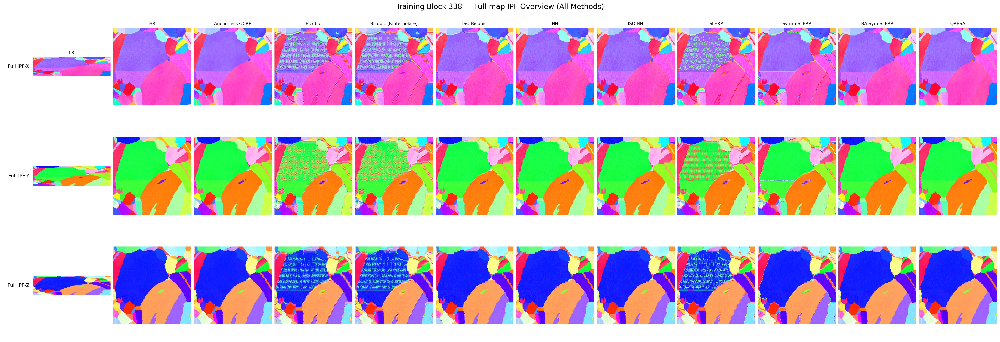

In [10]:
# ── Section 9b: Full-map IPF overview for all methods ───────────────────────
ref_dirs = ("X", "Y", "Z")
method_names = [name for name in METHODS.keys() if name in results]
col_labels = ["LR", "HR"] + method_names

full_maps = [
    dict(zip(ref_dirs, render_ipf_rgb(lr, sym))),
    dict(zip(ref_dirs, render_ipf_rgb(hr, sym))),
]
for name in method_names:
    full_maps.append(dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_full"], sym))))

n_cols = len(col_labels)
full_map_dpi = 220
fig = plt.figure(figsize=(2.4 * n_cols, 9.8), dpi=full_map_dpi, constrained_layout=True)
gs = fig.add_gridspec(
    3,
    n_cols + 1,
    width_ratios=[0.34] + [1] * n_cols,
)
fig.suptitle("Training Block 338 — Full-map IPF Overview (All Methods)", fontsize=15)

for r, rd in enumerate(ref_dirs):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, f"Full IPF-{rd}", ha="right", va="center", fontsize=10)

    for c, ipf_map in enumerate(full_maps, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.imshow(ipf_map[rd])
        ax.axis("off")
        if r == 0:
            ax.set_title(col_labels[c - 1], fontsize=9, pad=6)

plt.show()

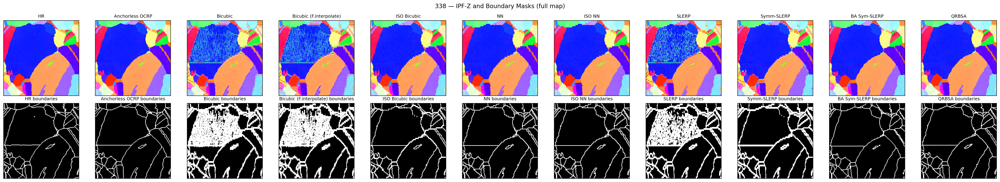

In [11]:
# ── Boundary F1 visualization: IPF-Z row + boundary masks ───────────────
from matplotlib.colors import Normalize

method_names = [name for name in METHODS.keys() if name in results]
col_labels = ["HR"] + method_names

# Row 1: IPF-Z
ipf_hr_z = render_ipf_rgb(hr, sym, ref_dir="Z")
ipf_sr_z = [render_ipf_rgb(results[name]["sr_full"], sym, ref_dir="Z") for name in method_names]

# Row 2: boundary masks (full map)
boundary_hr = compute_boundary_mask(hr, sym_ops=sym, threshold_deg=5.0, connectivity=4)
boundary_sr = [compute_boundary_mask(results[name]["sr_full"], sym_ops=sym, threshold_deg=5.0, connectivity=4) for name in method_names]

rows = 2
cols = len(col_labels)
fig = plt.figure(figsize=(2.6 * cols, 2.6 * rows), dpi=200)

# IPF-Z row
for j, label in enumerate(col_labels):
    ax = fig.add_subplot(rows, cols, j + 1)
    if label == "HR":
        ax.imshow(ipf_hr_z)
    else:
        ax.imshow(ipf_sr_z[j-1])
    ax.set_title(label, fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])

# Boundary row
for j, label in enumerate(col_labels):
    ax = fig.add_subplot(rows, cols, cols + j + 1)
    if label == "HR":
        ax.imshow(boundary_hr, cmap="gray", vmin=0, vmax=1)
    else:
        ax.imshow(boundary_sr[j-1], cmap="gray", vmin=0, vmax=1)
    ax.set_title(f"{label} boundaries", fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle(f"{sample_id} — IPF-Z and Boundary Masks (full map)", fontsize=12)
fig.tight_layout()


In [12]:
# ── Whole-map boundary F1 comparison ───────────────────────────────────────────
from IPython.display import display

boundary_threshold_deg = 5.0
boundary_connectivity = 4

method_names = [name for name in METHODS.keys() if name in results]

boundary_hr_full = compute_boundary_mask(
    hr,
    sym_ops=sym,
    threshold_deg=boundary_threshold_deg,
    connectivity=boundary_connectivity,
)

rows = []
for name in method_names:
    boundary_sr_full = compute_boundary_mask(
        results[name]["sr_full"],
        sym_ops=sym,
        threshold_deg=boundary_threshold_deg,
        connectivity=boundary_connectivity,
    )

    tp = int(np.sum(boundary_sr_full & boundary_hr_full))
    fp = int(np.sum(boundary_sr_full & ~boundary_hr_full))
    fn = int(np.sum(~boundary_sr_full & boundary_hr_full))

    precision = float(tp / (tp + fp)) if (tp + fp) > 0 else np.nan
    recall = float(tp / (tp + fn)) if (tp + fn) > 0 else np.nan
    f1 = boundary_f1_score(boundary_sr_full, boundary_hr_full)

    rows.append(
        {
            "Method": name,
            "Boundary Precision": precision,
            "Boundary Recall": recall,
            "Boundary F1": f1,
            "SR boundary %": 100.0 * float(np.mean(boundary_sr_full)),
            "HR boundary %": 100.0 * float(np.mean(boundary_hr_full)),
            "TP": tp,
            "FP": fp,
            "FN": fn,
        }
    )

df_boundary_full = (
    pd.DataFrame(rows)
    .set_index("Method")
    .sort_values("Boundary F1", ascending=False)
)

display(
    df_boundary_full.style
    .format(
        {
            "Boundary Precision": "{:.4f}",
            "Boundary Recall": "{:.4f}",
            "Boundary F1": "{:.4f}",
            "SR boundary %": "{:.2f}",
            "HR boundary %": "{:.2f}",
        }
    )
    .highlight_max(subset=["Boundary F1"], color="#e8f5e9")
    .set_caption(
        f"{sample_id} — whole-map boundary metrics "
        f"(threshold={boundary_threshold_deg:.1f}°, connectivity={boundary_connectivity})"
    )
)

df_boundary_full


,Boundary Precision,Boundary Recall,Boundary F1,SR boundary %,HR boundary %,TP,FP,FN
Method,,,,,,,,
Anchorless OCRP,0.7994,0.7725,0.7858,8.63,8.94,4524,1135,1332
QRBSA,0.7577,0.7978,0.7772,9.41,8.94,4672,1494,1184
NN,0.5599,0.6436,0.5989,10.27,8.94,3769,2962,2087
ISO NN,0.5599,0.6436,0.5989,10.27,8.94,3769,2962,2087
ISO Bicubic,0.5228,0.7001,0.5986,11.97,8.94,4100,3742,1756
Symm-SLERP,0.4375,0.9179,0.5925,18.75,8.94,5375,6911,481
BA Sym-SLERP,0.4023,0.3943,0.3983,8.76,8.94,2309,3430,3547
SLERP,0.2199,0.9346,0.3561,37.97,8.94,5473,19410,383
Bicubic,0.2005,0.9452,0.3308,42.12,8.94,5535,22072,321


,Boundary Precision,Boundary Recall,Boundary F1,SR boundary %,HR boundary %,TP,FP,FN
Method,,,,,,,,
Anchorless OCRP,0.799435,0.772541,0.785758,8.634949,8.935547,4524,1135,1332
QRBSA,0.757704,0.797814,0.777242,9.408569,8.935547,4672,1494,1184
NN,0.559947,0.643613,0.598872,10.270691,8.935547,3769,2962,2087
ISO NN,0.559947,0.643613,0.598872,10.270691,8.935547,3769,2962,2087
ISO Bicubic,0.522826,0.700137,0.598628,11.965942,8.935547,4100,3742,1756
Symm-SLERP,0.437490,0.917862,0.592548,18.746948,8.935547,5375,6911,481
BA Sym-SLERP,0.402335,0.394296,0.398275,8.757019,8.935547,2309,3430,3547
SLERP,0.219949,0.934597,0.356095,37.968445,8.935547,5473,19410,383
Bicubic,0.200493,0.945184,0.330813,42.124939,8.935547,5535,22072,321


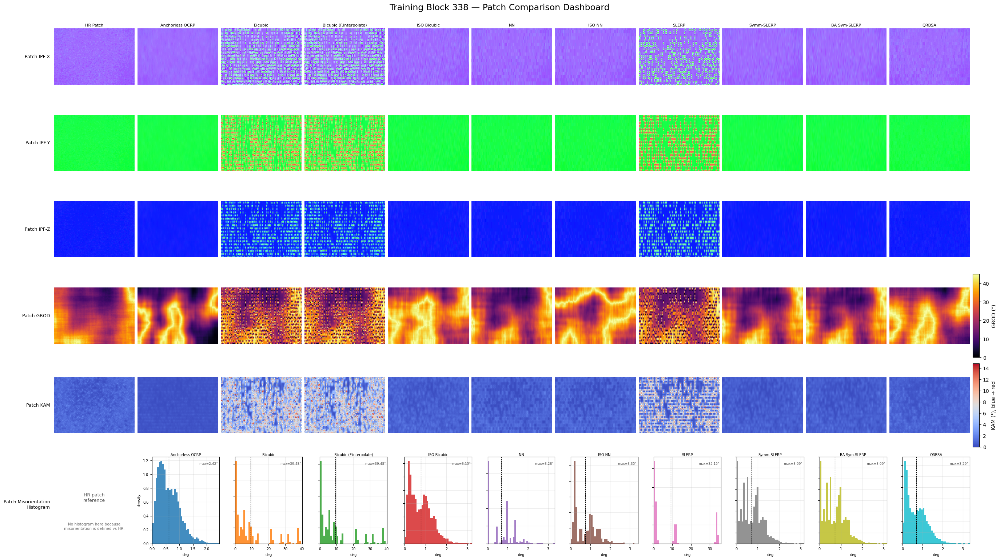

In [13]:
# ── Section 10: Combined patch dashboard (methods = columns, metrics = rows) ──
from matplotlib.colors import Normalize

method_names = [name for name in METHODS.keys() if name in results]
ref_dirs = ("X", "Y", "Z")
n_methods = len(method_names)
panel_names = ["HR Patch"] + method_names
n_data_cols = len(panel_names)

hr_patch = results["__hr_patch__"]
grod_hr = results["__grod_hr__"]
kam_hr = results["__kam_hr__"]

patch_ipf = {"HR Patch": dict(zip(ref_dirs, render_ipf_rgb(hr_patch, sym)))}
for name in method_names:
    patch_ipf[name] = dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_patch"], sym)))

vmax_grod = max([np.nanmax(grod_hr)] + [np.nanmax(results[n]["grod"]) for n in method_names])
vmax_kam = max([np.nanmax(kam_hr)] + [np.nanmax(results[n]["kam"]) for n in method_names])

row_labels = [
    "Patch IPF-X",
    "Patch IPF-Y",
    "Patch IPF-Z",
    "Patch GROD",
    "Patch KAM",
    "Patch Misorientation\nHistogram",
]

fig = plt.figure(
    figsize=(2.2 * (n_data_cols + 1.45), 15.3),
    constrained_layout=True,
)
gs = fig.add_gridspec(
    6,
    n_data_cols + 2,
    width_ratios=[0.48] + [1] * n_data_cols + [0.08],
    height_ratios=[1, 1, 1, 1, 1, 1.24],
)
fig.suptitle("Training Block 338 — Patch Comparison Dashboard", fontsize=17)

for r, label in enumerate(row_labels):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, label, ha="right", va="center", fontsize=9)

axes = []
for r in range(5):
    row_axes = []
    for c, panel_name in enumerate(panel_names, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.axis("off")
        if r == 0:
            ax.set_title(panel_name, fontsize=8, pad=4)
        row_axes.append(ax)
    axes.append(row_axes)

for ridx, rd in enumerate(ref_dirs):
    axes[ridx][0].imshow(patch_ipf["HR Patch"][rd])
    for c, name in enumerate(method_names, start=1):
        axes[ridx][c].imshow(patch_ipf[name][rd])

norm_grod = Normalize(vmin=0, vmax=vmax_grod)
for c in range(n_data_cols):
    data = grod_hr if c == 0 else results[method_names[c - 1]]["grod"]
    im_grod = axes[3][c].imshow(data, cmap="inferno", norm=norm_grod)
grod_cax = fig.add_subplot(gs[3, -1])
fig.colorbar(im_grod, cax=grod_cax, label="GROD (°)")

norm_kam = Normalize(vmin=0, vmax=vmax_kam)
for c in range(n_data_cols):
    data = kam_hr if c == 0 else results[method_names[c - 1]]["kam"]
    im_kam = axes[4][c].imshow(data, cmap="coolwarm", norm=norm_kam)
kam_cax = fig.add_subplot(gs[4, -1])
fig.colorbar(im_kam, cax=kam_cax, label="KAM (°), blue → red")

ax_hist_ref = fig.add_subplot(gs[5, 1])
ax_hist_ref.axis("off")
ax_hist_ref.text(0.5, 0.57, "HR patch\nreference", ha="center", va="center", fontsize=9, color="0.35")
ax_hist_ref.text(0.5, 0.29, "No histogram here because\nmisorientation is defined vs HR.", ha="center", va="center", fontsize=7.5, color="0.45")

hist_gs = gs[5, 2:n_data_cols + 1].subgridspec(1, n_methods, wspace=0.14)
hist_colors = list(plt.cm.tab10.colors) + list(plt.cm.Set2.colors)
for idx, name in enumerate(method_names):
    ax = fig.add_subplot(hist_gs[0, idx])
    m = results[name]["mis_patch"].ravel()
    m = m[~np.isnan(m)]
    m_max = float(np.nanmax(m)) if m.size else 1.0
    x_hi = max(1.0, m_max * 1.02)
    bins = np.linspace(0.0, x_hi, 41)
    ax.hist(
        m,
        bins=bins,
        density=True,
        color=hist_colors[idx % len(hist_colors)],
        alpha=0.84,
    )
    ax.axvline(np.nanmean(m), color="black", linestyle="--", linewidth=0.8)
    ax.grid(True, alpha=0.25)
    ax.set_xlim(0, x_hi)
    ax.tick_params(labelsize=7)
    ax.set_title(name, fontsize=7, pad=2)
    ax.set_xlabel("deg", fontsize=7)
    ax.text(
        0.98,
        0.94,
        f"max={m_max:.2f}°",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6.5,
        color="0.35",
    )
    if idx == 0:
        ax.set_ylabel("density", fontsize=7)
    else:
        ax.set_yticklabels([])

plt.show()


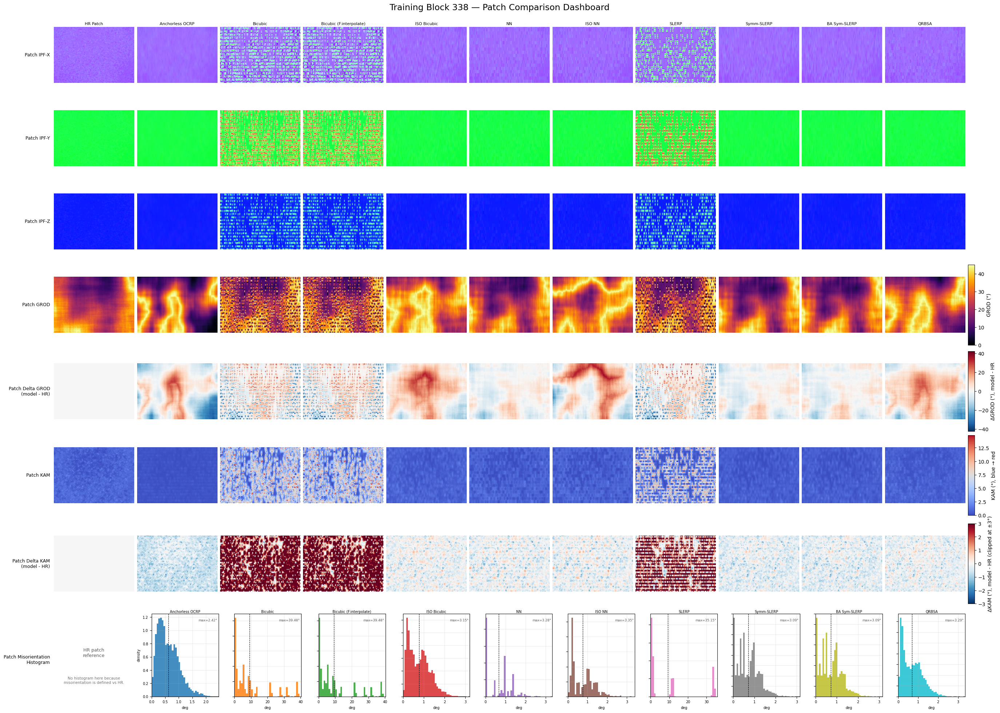

In [14]:
# ── Section 11: Combined patch dashboard (methods = columns, metrics = rows) ──
from matplotlib.colors import Normalize, TwoSlopeNorm

method_names = [name for name in METHODS.keys() if name in results]
ref_dirs = ("X", "Y", "Z")
n_methods = len(method_names)
panel_names = ["HR Patch"] + method_names
n_data_cols = len(panel_names)

hr_patch = results["__hr_patch__"]
grod_hr = results["__grod_hr__"]
kam_hr = results["__kam_hr__"]

patch_ipf = {"HR Patch": dict(zip(ref_dirs, render_ipf_rgb(hr_patch, sym)))}
for name in method_names:
    patch_ipf[name] = dict(zip(ref_dirs, render_ipf_rgb(results[name]["sr_patch"], sym)))

vmax_grod = max([np.nanmax(grod_hr)] + [np.nanmax(results[n]["grod"]) for n in method_names])
vmax_kam = max([np.nanmax(kam_hr)] + [np.nanmax(results[n]["kam"]) for n in method_names])
vmax_grod_delta = max(
    [0.0] + [float(np.nanmax(np.abs(results[n]["grod_delta"]))) for n in method_names]
 )
KAM_DELTA_PLOT_CLIP_DEG = 3.0

row_labels = [
    "Patch IPF-X",
    "Patch IPF-Y",
    "Patch IPF-Z",
    "Patch GROD",
    "Patch Delta GROD\n(model - HR)",
    "Patch KAM",
    "Patch Delta KAM\n(model - HR)",
    "Patch Misorientation\nHistogram",
]

fig = plt.figure(
    figsize=(2.2 * (n_data_cols + 1.45), 19.5),
    constrained_layout=True,
)
gs = fig.add_gridspec(
    8,
    n_data_cols + 2,
    width_ratios=[0.48] + [1] * n_data_cols + [0.08],
    height_ratios=[1, 1, 1, 1, 1, 1, 1, 1.24],
)
fig.suptitle("Training Block 338 — Patch Comparison Dashboard", fontsize=17)

for r, label in enumerate(row_labels):
    ax_label = fig.add_subplot(gs[r, 0])
    ax_label.axis("off")
    ax_label.text(0.98, 0.5, label, ha="right", va="center", fontsize=9)

axes = []
for r in range(7):
    row_axes = []
    for c, panel_name in enumerate(panel_names, start=1):
        ax = fig.add_subplot(gs[r, c])
        ax.axis("off")
        if r == 0:
            ax.set_title(panel_name, fontsize=8, pad=4)
        row_axes.append(ax)
    axes.append(row_axes)

for ridx, rd in enumerate(ref_dirs):
    axes[ridx][0].imshow(patch_ipf["HR Patch"][rd])
    for c, name in enumerate(method_names, start=1):
        axes[ridx][c].imshow(patch_ipf[name][rd])

norm_grod = Normalize(vmin=0, vmax=vmax_grod)
for c in range(n_data_cols):
    data = grod_hr if c == 0 else results[method_names[c - 1]]["grod"]
    im_grod = axes[3][c].imshow(data, cmap="inferno", norm=norm_grod)
grod_cax = fig.add_subplot(gs[3, -1])
fig.colorbar(im_grod, cax=grod_cax, label="GROD (°)")

norm_grod_delta = TwoSlopeNorm(vmin=-vmax_grod_delta, vcenter=0.0, vmax=vmax_grod_delta)
for c in range(n_data_cols):
    data = np.zeros_like(grod_hr) if c == 0 else results[method_names[c - 1]]["grod_delta"]
    im_grod_delta = axes[4][c].imshow(data, cmap="RdBu_r", norm=norm_grod_delta)
grod_delta_cax = fig.add_subplot(gs[4, -1])
fig.colorbar(im_grod_delta, cax=grod_delta_cax, label="ΔGROD (°), model - HR")

norm_kam = Normalize(vmin=0, vmax=vmax_kam)
for c in range(n_data_cols):
    data = kam_hr if c == 0 else results[method_names[c - 1]]["kam"]
    im_kam = axes[5][c].imshow(data, cmap="coolwarm", norm=norm_kam)
kam_cax = fig.add_subplot(gs[5, -1])
fig.colorbar(im_kam, cax=kam_cax, label="KAM (°), blue → red")

norm_kam_delta = TwoSlopeNorm(
    vmin=-KAM_DELTA_PLOT_CLIP_DEG,
    vcenter=0.0,
    vmax=KAM_DELTA_PLOT_CLIP_DEG,
)
for c in range(n_data_cols):
    data = (
        np.zeros_like(kam_hr)
        if c == 0
        else np.clip(
            results[method_names[c - 1]]["kam_delta"],
            -KAM_DELTA_PLOT_CLIP_DEG,
            KAM_DELTA_PLOT_CLIP_DEG,
        )
    )
    im_kam_delta = axes[6][c].imshow(data, cmap="RdBu_r", norm=norm_kam_delta)
kam_delta_cax = fig.add_subplot(gs[6, -1])
fig.colorbar(
    im_kam_delta,
    cax=kam_delta_cax,
    label=f"ΔKAM (°), model - HR (clipped at ±{KAM_DELTA_PLOT_CLIP_DEG:.0f}°)",
)

ax_hist_ref = fig.add_subplot(gs[7, 1])
ax_hist_ref.axis("off")
ax_hist_ref.text(0.5, 0.57, "HR patch\nreference", ha="center", va="center", fontsize=9, color="0.35")
ax_hist_ref.text(0.5, 0.29, "No histogram here because\nmisorientation is defined vs HR.", ha="center", va="center", fontsize=7.5, color="0.45")

hist_gs = gs[7, 2:n_data_cols + 1].subgridspec(1, n_methods, wspace=0.14)
hist_colors = list(plt.cm.tab10.colors) + list(plt.cm.Set2.colors)
for idx, name in enumerate(method_names):
    ax = fig.add_subplot(hist_gs[0, idx])
    m = results[name]["mis_patch"].ravel()
    m = m[~np.isnan(m)]
    m_max = float(np.nanmax(m)) if m.size else 1.0
    x_hi = max(1.0, m_max * 1.02)
    bins = np.linspace(0.0, x_hi, 41)
    ax.hist(
        m,
        bins=bins,
        density=True,
        color=hist_colors[idx % len(hist_colors)],
        alpha=0.84,
    )
    ax.axvline(np.nanmean(m), color="black", linestyle="--", linewidth=0.8)
    ax.grid(True, alpha=0.25)
    ax.set_xlim(0, x_hi)
    ax.tick_params(labelsize=7)
    ax.set_title(name, fontsize=7, pad=2)
    ax.set_xlabel("deg", fontsize=7)
    ax.text(
        0.98,
        0.94,
        f"max={m_max:.2f}°",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6.5,
        color="0.35",
    )
    if idx == 0:
        ax.set_ylabel("density", fontsize=7)
    else:
        ax.set_yticklabels([])

plt.show()


In [15]:
# ── Section 12: Patch scalar metrics summary ─────────────────────────────────
from IPython.display import display

method_names = [name for name in METHODS.keys() if name in results]

rows = []
for name in method_names:
    r = results[name]
    rows.append({
        "Method": name,
        "Mis mean": r["mis_stats"]["mean"],
        "Mis median": r["mis_stats"]["median"],
        "Mis p90": r["mis_stats"]["p90"],
        "PSNR mis": r["mis_stats"]["psnr"],
        "SSIM IPF": r["mis_stats"]["ssim"],
        "Boundary F1": r["boundary_f1"],
        "abs(mean(GROD method - GROD HR))": abs(r["grod_stats"]["mean_diff"]),
        "std(GROD method - GROD HR)": r["grod_delta_std"],
        "abs(mean(KAM method - KAM HR))": abs(r["kam_stats"]["mean_diff"]),
        "std(KAM method - KAM HR)": r["kam_delta_std"],
    })

df_summary = pd.DataFrame(rows).set_index("Method").T
metric_order = [
    "Mis mean",
    "Mis median",
    "Mis p90",
    "PSNR mis",
    "SSIM IPF",
    "Boundary F1",
    "abs(mean(GROD method - GROD HR))",
    "std(GROD method - GROD HR)",
    "abs(mean(KAM method - KAM HR))",
    "std(KAM method - KAM HR)",
    
]
df_summary = df_summary.loc[metric_order]

metric_pref = {
    "Mis mean": "min",
    "Mis median": "min",
    "Mis p90": "min",
    "PSNR mis": "max",
    "SSIM IPF": "max",
    "Boundary F1": "max",
    "abs(mean(GROD method - GROD HR))": "min",
    "std(GROD method - GROD HR)": "min",
    "abs(mean(KAM method - KAM HR))": "min",
    "std(KAM method - KAM HR)": "min",
}


quick_rows = []
for metric in df_summary.index:
    vals = pd.to_numeric(df_summary.loc[metric], errors="coerce")
    direction = metric_pref.get(metric)
    if direction is None:
        print(f"Warning: metric_pref missing '{metric}', defaulting to 'min'")
        direction = 'min'
    if direction == "max":
        best_method = vals.idxmax()
        best_value = float(np.nanmax(vals.to_numpy(dtype=float)))
        better = "higher"
    elif direction == "absmin":
        best_method = np.abs(vals).idxmin()
        best_value = float(vals.loc[best_method])
        better = "closest to 0"
    else:
        best_method = vals.idxmin()
        best_value = float(np.nanmin(vals.to_numpy(dtype=float)))
        better = "lower"
    quick_rows.append({
        "Metric": metric,
        "Better": better,
        "Best method": best_method,
        "Best value": best_value,
    })
quick_read = pd.DataFrame(quick_rows).set_index("Metric")

reference_means = pd.DataFrame(
    {
        "HR patch": {
            "GROD HR mean": results["__hr_patch_stats__"]["grod_mean"],
            "GROD HR std": results["__hr_patch_stats__"]["grod_std"],
            "KAM HR mean": results["__hr_patch_stats__"]["kam_mean"],
            "KAM HR std": results["__hr_patch_stats__"]["kam_std"],
        }
    }
)

print("Patch scalar summary: lower is better except PSNR mis and SSIM IPF, where higher is better.")
print("|mean(GROD method - GROD HR)| and |mean(KAM method - KAM HR)| are absolute mean differences; lower is better.")
print("PSNR uses misorientation vs zero error; SSIM is computed on the IPF RGB patch (ref_dir=Z) vs HR.")
if not SKIMAGE_AVAILABLE:
    print("SSIM is unavailable because scikit-image is not installed in this kernel.")



grod_kam_means = pd.DataFrame(
    {
        "GROD mean": {name: results[name]["grod_stats"]["mean"] for name in method_names},
        "KAM mean": {name: results[name]["kam_stats"]["mean"] for name in method_names},
    }
)

grod_kam_means.loc["HR reference"] = [
    results["__hr_patch_stats__"]["grod_mean"],
    results["__hr_patch_stats__"]["kam_mean"],
]
display(
    reference_means.style
    .format("{:.3f}")
    .set_caption("HR patch reference means")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "12px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)

display(
    grod_kam_means.style
    .format("{:.3f}")
    .set_caption("GROD/KAM means by method (HR reference included)")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "12px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)

display(
    quick_read.style
    .format({"Best value": "{:.3f}"})
    .set_caption("Quick read: best-performing method by metric")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "12px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)


def _highlight_by_direction(row):
    vals = row.to_numpy(dtype=float)
    finite = np.isfinite(vals)
    if not np.any(finite):
        return [""] * len(vals)
    direction = metric_pref[row.name]
    if direction == "max":
        best = np.nanmax(vals)
        worst = np.nanmin(vals)
        key_vals = vals
    elif direction == "absmin":
        key_vals = np.abs(vals)
        best = np.nanmin(key_vals)
        worst = np.nanmax(key_vals)
    else:
        best = np.nanmin(vals)
        worst = np.nanmax(vals)
        key_vals = vals

    styles = []
    for i, v in enumerate(vals):
        if not np.isfinite(v):
            styles.append("color: #777777;")
        elif np.isclose(key_vals[i], best, equal_nan=False):
            styles.append("background-color: #e8f5e9; font-weight: 700; border: 2px solid #2e7d32;")
        elif np.isclose(key_vals[i], worst, equal_nan=False) and np.count_nonzero(finite) > 1:
            styles.append("background-color: #fdecea;")
        else:
            styles.append("")
    return styles


styled_summary = (
    df_summary.style
    .format("{:.3f}")
    .apply(_highlight_by_direction, axis=1)
    .set_caption("Patch scalar metrics summary")
    .set_table_styles([
        {"selector": "caption", "props": [("caption-side", "top"), ("font-size", "13px"), ("font-weight", "600")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px 10px"), ("background-color", "#f4f6f8")]},
        {"selector": "td", "props": [("text-align", "center"), ("padding", "6px 10px")]},
    ])
)

display(styled_summary)

df_summary


Patch scalar summary: lower is better except PSNR mis and SSIM IPF, where higher is better.
|mean(GROD method - GROD HR)| and |mean(KAM method - KAM HR)| are absolute mean differences; lower is better.
PSNR uses misorientation vs zero error; SSIM is computed on the IPF RGB patch (ref_dir=Z) vs HR.


,HR patch
GROD HR mean,24.081
GROD HR std,9.136
KAM HR mean,0.881
KAM HR std,0.371


,GROD mean,KAM mean
Anchorless OCRP,23.453,0.291
Bicubic,24.175,4.978
Bicubic (F.interpolate),24.175,4.978
ISO Bicubic,32.180,0.739
NN,23.835,0.703
ISO NN,31.034,0.713
SLERP,23.442,3.810
Symm-SLERP,23.703,0.594
BA Sym-SLERP,23.703,0.594
QRBSA,28.721,0.688


,Better,Best method,Best value
Metric,,,
Mis mean,lower,Anchorless OCRP,0.613
Mis median,lower,Anchorless OCRP,0.539
Mis p90,lower,Anchorless OCRP,1.137
PSNR mis,higher,Anchorless OCRP,47.875
SSIM IPF,higher,Anchorless OCRP,0.824
Boundary F1,higher,Anchorless OCRP,0.786
abs(mean(GROD method - GROD HR)),lower,Bicubic,0.094
std(GROD method - GROD HR),lower,NN,4.764
abs(mean(KAM method - KAM HR)),lower,ISO Bicubic,0.142


Method,Anchorless OCRP,Bicubic,Bicubic (F.interpolate),ISO Bicubic,NN,ISO NN,SLERP,Symm-SLERP,BA Sym-SLERP,QRBSA
Mis mean,0.613,9.217,9.217,0.781,0.669,0.747,9.198,0.710,0.710,0.693
Mis median,0.539,5.202,5.202,0.725,0.704,0.703,1.168,0.677,0.677,0.614
Mis p90,1.137,28.287,28.287,1.467,1.414,1.488,33.525,1.366,1.366,1.384
PSNR mis,47.875,21.931,21.931,45.698,45.829,45.739,21.176,46.317,46.317,46.457
SSIM IPF,0.824,0.043,0.043,0.759,0.775,0.768,0.040,0.778,0.778,0.795
Boundary F1,0.786,0.331,0.331,0.599,0.599,0.599,0.356,0.593,0.398,0.777
abs(mean(GROD method - GROD HR)),0.627,0.094,0.094,8.099,0.245,6.953,0.638,0.378,0.378,4.640
std(GROD method - GROD HR),12.600,10.236,10.236,10.027,4.764,11.822,10.525,4.884,4.884,10.480
abs(mean(KAM method - KAM HR)),0.590,4.097,4.097,0.142,0.177,0.168,2.929,0.287,0.287,0.192
std(KAM method - KAM HR),0.343,2.964,2.964,0.391,0.415,0.416,3.344,0.379,0.379,0.370


Method,Anchorless OCRP,Bicubic,Bicubic (F.interpolate),ISO Bicubic,NN,ISO NN,SLERP,Symm-SLERP,BA Sym-SLERP,QRBSA
Mis mean,0.612728,9.216963,9.216963,0.781011,0.669197,0.747178,9.197696,0.710434,0.710434,0.692578
Mis median,0.539130,5.202223,5.202223,0.725371,0.703592,0.703496,1.168444,0.677341,0.677341,0.614190
Mis p90,1.136746,28.286659,28.286659,1.467143,1.414200,1.488080,33.524818,1.366464,1.366464,1.383902
PSNR mis,47.875251,21.930897,21.930897,45.698057,45.828713,45.739287,21.176441,46.316920,46.316919,46.457259
SSIM IPF,0.823743,0.042736,0.042736,0.759118,0.774563,0.768124,0.039624,0.777980,0.777980,0.794635
Boundary F1,0.785758,0.330813,0.330813,0.598628,0.598872,0.598872,0.356095,0.592548,0.398275,0.777242
abs(mean(GROD method - GROD HR)),0.627110,0.094206,0.094206,8.099348,0.245285,6.953145,0.638454,0.377545,0.377545,4.640360
std(GROD method - GROD HR),12.600281,10.235862,10.235862,10.027148,4.763980,11.822125,10.524760,4.884118,4.884118,10.480280
abs(mean(KAM method - KAM HR)),0.590033,4.097324,4.097324,0.141760,0.177260,0.167787,2.928819,0.286511,0.286511,0.192255
std(KAM method - KAM HR),0.342915,2.964415,2.964415,0.391140,0.414575,0.416160,3.343514,0.378913,0.378913,0.369904


In [16]:
# ── Final cleanup: release GPU memory ─────────────────────────────────────
import gc

_moved_models = []
_deleted_names = []

for _name, _obj in list(globals().items()):
    if isinstance(_obj, torch.nn.Module):
        try:
            _obj.to(torch.device('cpu'))
            _moved_models.append(_name)
        except Exception:
            pass

for _name, _obj in list(globals().items()):
    if isinstance(_obj, torch.Tensor) and _obj.is_cuda:
        del globals()[_name]
        _deleted_names.append(_name)

for _name in [
    'results', 'full_maps', 'patch_ipf', 'df_summary', 'styled_summary',
    'sr_t', 'lr_t', 'hr_t', 'feat_lr', 'feat_hr_flat', 'sr_flat',
    'lr_active', 'sr_active', 'sr_passive', 'debug_payload'
]:
    if _name in globals():
        del globals()[_name]
        _deleted_names.append(_name)

plt.close('all')
gc.collect()
if torch.cuda.is_available():
    try:
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()
    except Exception:
        pass

print('Moved models to CPU:', sorted(set(_moved_models)))
print('Deleted GPU-heavy globals:', sorted(set(_deleted_names)))
print('CUDA cleanup complete.')


Moved models to CPU: ['model', 'model_anchorless_ocrp', 'model_bicubic_finterp', 'model_qrbsa']
Deleted GPU-heavy globals: ['df_summary', 'full_maps', 'patch_ipf', 'results', 'styled_summary']
CUDA cleanup complete.
